In [1]:
import os
import sys
import time
import copy
import glob
import shap
import pickle
import random
import string
import joblib
import matplotlib
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
from joblib import load
from scipy import stats
from matplotlib import cm
import statsmodels.api as sm
from keras.models import Model
from scipy.stats import zscore
from collections import Counter
from scipy.stats import entropy
from ipywidgets import interact
import matplotlib.pyplot as plt
from scipy.stats import ks_2samp
import matplotlib.lines as mlines
import plotly.graph_objects as go
from sklearn.cluster import DBSCAN
from keras.models import load_model
import matplotlib.colors as mcolors
from sklearn.metrics import r2_score
from scipy.stats import kstest, norm
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import pearsonr, spearmanr
from sklearn.ensemble import IsolationForest
from tensorflow.keras.models import load_model
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MaxAbsScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import median_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PowerTransformer
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.cross_decomposition import CCA, PLSRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, accuracy_score
  

def plot_distributions(network_input, network_output, ground_truth, sample_idx):
    plt.figure(figsize=(12, 4))
    sns.histplot(network_input[sample_idx].flatten(), color="skyblue", label="Input", kde=True)
    sns.histplot(network_output[sample_idx].flatten(), color="red", label="Output", kde=True)
    sns.histplot(ground_truth[sample_idx].flatten(), color="green", label="Ground Truth", kde=True)
    plt.legend()
    plt.title(f'Distribution Comparison for Sample {sample_idx}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.show()
    

def error_distribution_analysis(network_output, ground_truth):
    errors = network_output - ground_truth
    sns.histplot(errors.flatten(), kde=True, color="red")
    plt.title('Overall Error Distribution')
    plt.xlabel('Error')
    plt.ylabel('Frequency')
    plt.show()  
    

def calculate_samplewise_mae(network_output, ground_truth):
    return np.mean(np.abs(network_output - ground_truth), axis=(1, 2))


def plot_error_vs_all_parameters(df, network_output, ground_truth):
    sample_mae = calculate_samplewise_mae(network_output, ground_truth)
    df['Error'] = sample_mae
    parameters = ['planet_radius', 'planet_mass', 'co_ratio', 'isothermal_T', 'metalicity']
    plt.figure(figsize=(15, 10))
    for i, param in enumerate(parameters, 1):
        plt.subplot(2, 3, i)
        sns.scatterplot(x=df[param], y=df['Error'])
        plt.xlabel(param)
        plt.ylabel('Error')
        plt.title(f'Error vs. {param}')
    plt.tight_layout()
    plt.show()


def preprocessing_function(log_data, params=None):
    log_data = np.clip(log_data, a_min=-20, a_max=None)
    min_value = -20
    max_value = 0
    min_max_scaled_data = (log_data - min_value) / (max_value - min_value) * 2 - 1
    min_max_scaled_data = np.nan_to_num(min_max_scaled_data, 0)
    return min_max_scaled_data


def data_norm(name, output = False,network = False, save_idx=None):
    """Load one data example and use log transform
    Return array of size (Layers, Molecules, 1)"""
    arr = load_array_3d(name) # arr shape is (100,111) or (layers, molecules)
    if network:
        arr = arr.reshape((64,64))
        return arr
    if output :
        arr = arr[-1]
    if save_idx is not None:
        arr = arr[save_idx,:]
    arr = np.log10(arr)[:,:64]  # logarithm 
    arr = preprocessing_function(arr) 
    return arr


def load_data(data_dir, output=False,network = False, save_idx=None):
    """Load all data (Train/Test) and apply log transform
    Return it as np array of size (number_of_examples, Layers, Molecules,1)"""
    data_list = np.sort(glob.glob(f'{data_dir}/*npy'))
    array = []
    _ = [array.append(data_norm(name, output=output,network=network, save_idx=save_idx)) for name in data_list]
    array = np.array(array)
    return array, data_list


def create_dict(names):
    molecule_dict = {}
    for name in names:
        molecule_dict[name] = []
    return molecule_dict


def load_array_3d(filename):
    with open(filename, 'rb') as f:
        arr = np.load(f)
    return arr


def inverse_preprocessing(scaled_data):
    min_value = -20
    max_value = 0
    log_data = ((scaled_data + 1) / 2) * (max_value - min_value) + min_value
    return log_data


def calculate_correlations(df, network_output, ground_truth):
    sample_mae = calculate_samplewise_mae(network_output, ground_truth)
    df['Error'] = sample_mae
    parameters = ['planet_radius', 'planet_mass', 'co_ratio', 'isothermal_T', 'metalicity']
    for param in parameters:
        pearson_corr, _ = pearsonr(df[param], df['Error'])
        spearman_corr, _ = spearmanr(df[param], df['Error'])
        print(f"{param} - Pearson correlation with error: {pearson_corr:.3f}")
        print(f"{param} - Spearman correlation with error: {spearman_corr:.3f}")


def tidy_values(x):
    if x == 0:
        return 0
    elif abs(x) < 0.0001:
        return format(x, '.2e')  # Scientific notation for small numbers
    else:
        return round(x, 5)  # Round to 5 significant digits for larger numbers


def convert_pascals_to_bars(pascals):
        """Convert a list of values from Pascals to Bars."""
        return [pascal * 1e-5 for pascal in pascals]
    
    
    
def print_statistics(network_output, ground_truth, name):
    network_output_2d = network_output.reshape(network_output.shape[0], -1)
    ground_truth_2d = ground_truth.reshape(ground_truth.shape[0], -1)

    mae_per_atmosphere = np.mean(np.abs(ground_truth - network_output), axis=(1, 2))
    highest_mae = round(np.max(mae_per_atmosphere), 4)
    lowest_mae = round(np.min(mae_per_atmosphere), 4)
    
    mse_net =  round(mean_squared_error(ground_truth_2d, network_output_2d),5)
    mae_net =  round(mean_absolute_error(ground_truth_2d, network_output_2d),4)
    std_net= round(np.std(ground_truth_2d - network_output_2d),4)
    #kl_divs = calculate_kl_divergence(ground_truth_2d, network_output_2d) 
    print(f'Model {name} & {highest_mae} & {lowest_mae} & {mae_net} & {mse_net} & {std_net} \\\\')
    
    
def print_statistics_MAPE(network_output, ground_truth, name):
    epsilon = 1e-10
    mape_per_atmosphere = np.mean(np.abs((network_output - ground_truth) / (ground_truth + epsilon)), axis=(1, 2)) * 100

    
    num_samples_above_10_percent = np.sum(mape_per_atmosphere > 10)
    p_10 = round(100*num_samples_above_10_percent/len(mape_per_atmosphere),2) 
    num_samples_above_50_percent = np.sum(mape_per_atmosphere > 50)
    p_50 = round(100*num_samples_above_50_percent/len(mape_per_atmosphere),2)
    
    print(f'Model {name} & {num_samples_above_10_percent} & {p_10} & {num_samples_above_50_percent} & {p_50} \\\\')
    
    
    
def print_statistics_KL(network_output, ground_truth, name):
    kl_divs = [calculate_kl_divergence(ground_truth[i], network_output[i]) for i in range(len(ground_truth))]
    mean_kl_div_gt_to_network = round(np.mean(kl_divs), 7)
    highest_kl_div_gt_to_network = round(np.max(kl_divs), 7)
    lowest_kl_div_gt_to_network = round(np.min(kl_divs), 9)
    
    print(f'Model {name}  & {mean_kl_div_gt_to_network} & {highest_kl_div_gt_to_network} & {lowest_kl_div_gt_to_network} & \\\\')

In [2]:
data_example = pd.read_csv(glob.glob(...)[0])
pressure = np.array(data_example['Pressure'].to_list())[:64]
data_example = data_example.drop(columns=['Altitude_m','Pressure'])

molecules = data_example.columns.to_list()
molecule_dict = create_dict(molecules)

save_molecules = np.array([ 34,  36,  39,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,
        51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,
        64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,
        77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  90,  91,
        94,  96,  97, 100, 101, 102, 104, 105, 106, 108, 109, 110])


path = ...
molecule_len = len(save_molecules)
molecules = list(np.array(molecules)[save_molecules])
network_output_dl16, data_list= load_data(..., save_idx=save_molecules, network=True)
network_output_dl8, data_list= load_data(..., save_idx=save_molecules, network=True)
network_output_att, data_list= load_data(..., save_idx=save_molecules, network=True)
network_output_att_addinf, data_list= load_data(..., save_idx=save_molecules, network=True)
network_output_simple, data_list= load_data(..., save_idx=save_molecules, network=True)

file_names = [path.split('/')[-1].split('.')[0] for path in data_list]
configuration = pd.read_csv(...)[:5148]
configuration = configuration[configuration['System_ID'].isin(file_names)]
configuration = configuration.sort_values(by='System_ID', key=lambda x:
                                                    x.map({name: i for i, name in enumerate(file_names)}))
configuration = configuration.reset_index(drop=True)
network_input, _= load_data(f'{path}input/', save_idx=save_molecules)

file_names = [path.split('/')[-1].split('.')[0] for path in data_list]


data_list_X = np.sort(glob.glob(...))
file_names = [path.split('/')[-1] for path in data_list_X]

co_ratio = np.array(configuration['co_ratio'].to_list())
planet_mass = np.array(configuration['planet_mass'].to_list())
planet_radius = np.array(configuration['planet_radius'].to_list())
temp = np.array(configuration['isothermal_T'].to_list())
metallicity = np.array(configuration['metalicity'].to_list())

ground_truth, data_list_gt= load_data(..., save_idx=save_molecules, output=True)
file_names_gt = [path.split('/')[-1].split('.')[0] for path in data_list_gt]

# Notes
(A) Simple Model = network_output_simple

(B) Unet with Attention = network_output_att

(C) Unet with Attention and Add info = network_output_att_addinf

(D) Unet with Att, Add Info, DL, bs16 = network_output_dl16

(E) Unet with Att, Add Info, DL, bs8 = network_output_dl8

In [3]:
# Atmospheres identification
index_atmosphere_dict = {
    7: 'A1',
    32: 'A2',
    429: 'A3',
    1291: 'A4',
    2075: 'A5',
    3037: 'A6',
    3498:'A7',
    5110:'A8',
    648:'A9',
    3254:'A10',
    156:'A11', 
    2860:'A12',  
    5058:'A13',  
    161:'A14'}

# KL Divergence

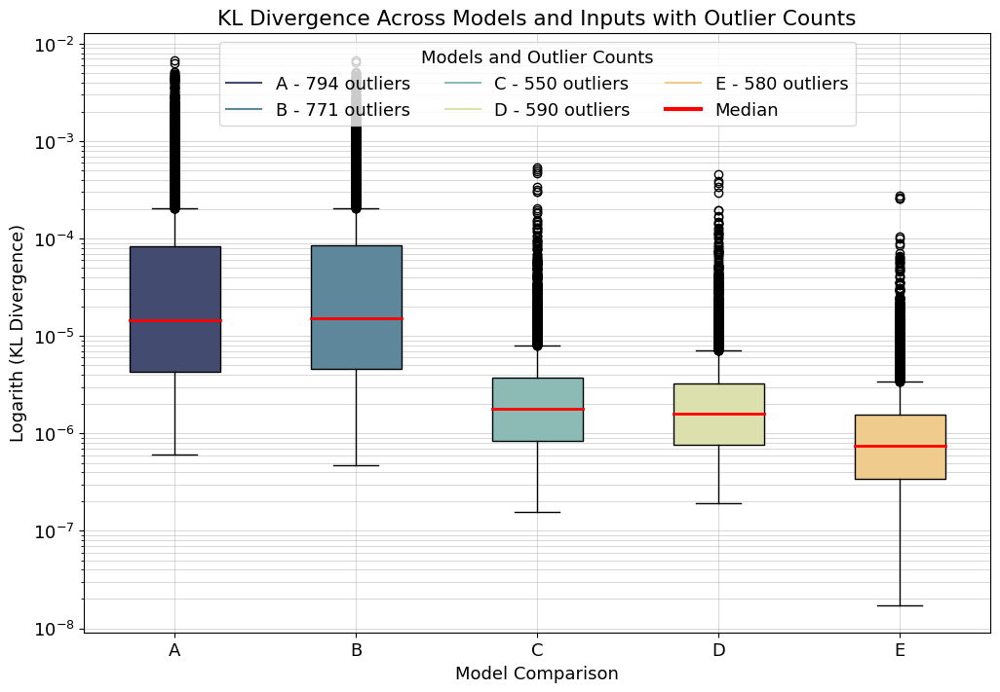

In [4]:
plt.rc('font', size=13)

def calculate_kl_divergence(distribution1, distribution2):
    epsilon = 2  # Small constant to prevent zero probabilities
    dist1_normalized = (distribution1.flatten() + epsilon) / np.sum(distribution1.flatten() + epsilon)
    dist2_normalized = (distribution2.flatten() + epsilon) / np.sum(distribution2.flatten() + epsilon)
    return entropy(dist2_normalized, dist1_normalized)

kl_divergences = []
outliers_count = []
labels = ['A', 'B', 'C', 'D', 'E']
network_outputs = [network_output_simple, network_output_att, network_output_att_addinf,
                   network_output_dl16, network_output_dl8]

for output in network_outputs:
    kl_divs = [calculate_kl_divergence(ground_truth[i], output[i]) for i in range(len(ground_truth))]
    kl_divergences.append(kl_divs)
    q1, q3 = np.percentile(kl_divs, [25, 75])
    iqr = q3 - q1
    outlier_threshold = q3 + 1.5 * iqr
    outliers_count.append(sum(x > outlier_threshold for x in kl_divs))

# Custom colors
n_colors = 100
cmap = mcolors.LinearSegmentedColormap.from_list("CustomCmap", ['#444B70', '#6FAEB7', '#F4EBAB', '#E8A065'],
                                                 N=n_colors)
colors = cmap(np.linspace(0, 1, len(labels)+1))

# Create the box plot
plt.figure(figsize=(12, 8))
box = plt.boxplot(kl_divergences, patch_artist=True, labels=labels, showfliers=True)



for patch, color, label, count,median in zip(box['boxes'], colors, labels, outliers_count,box['medians']):
    patch.set_facecolor(color)
    patch.set_label(f"{label} - {count} outliers")
    median.set_color('red')
    median.set_linewidth(2)

# Adding custom legend for outliers
custom_legend = [plt.Line2D([0], [0], color=cmap(i / len(labels)), label=f'{label} - {count} outliers') 
                 for i, (label, count) in enumerate(zip(labels, outliers_count))]
custom_legend.append(plt.Line2D([0], [0], color='red', linewidth=3, label='Median'))
plt.legend(handles=custom_legend, title="Models and Outlier Counts", loc="upper center", ncol=3)
plt.grid(True, which='both', linestyle='-', linewidth=0.5, alpha=0.7)
plt.xlabel('Model Comparison')
plt.ylabel('Logarith (KL Divergence)')
plt.yscale('log')
plt.title('KL Divergence Across Models and Inputs with Outlier Counts')
plt.savefig('KL_div_model_comparison_V2.png', dpi=300,bbox_inches='tight')
plt.show()



# Ground truth vs Network prediction for selected molecules

In [5]:
colors = ['#D55E00', '#56B4E9', '#009E73', '#F0E442'] 

def gt_vs_predict_one_molecule_one_atmospheres(ground_truth, network_outputs, network_input, n, ind, 
                           labels, configuration, name, index_atmosphere_dict):
    # Extract configuration data for the title
    co, m, t = configuration.loc[n][['co_ratio', 'metalicity', 'isothermal_T']]
    colors = ['#444B70', '#EFCB8C']
    colors_line = ['#444B70', '#a78e62']
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12))
    gt_flat = ground_truth[n, ind, :].flatten()
    min_val, max_val = np.inf, -np.inf
    
    gt_sorted_indices = np.argsort(gt_flat)
    gt_sorted = gt_flat[gt_sorted_indices]
    
    for i, network_output in enumerate(network_outputs):
        output_flat = network_output[n, ind, :].flatten()
        residuals = output_flat - gt_flat
        residuals_sorted = residuals[gt_sorted_indices]
        label = labels[i] if i < len(network_outputs) else 'Input'
        markers = ['o','*']
        ms_l=[60,120]
        s_res = ['--','-.']
        # For better visibility, adjust line styles or markers
        ax1.scatter(gt_flat, output_flat, marker = markers[i], 
                    s=ms_l[i], color=colors[i], label=label, edgecolors='black', lw=1)
        
        # Line plot for residuals
        ax2.plot(gt_sorted, residuals_sorted, s_res[i], color=colors_line[i], label=label, lw=2)

        min_val = min(min_val, gt_flat.min(), output_flat.min())
        max_val = max(max_val, gt_flat.max(), output_flat.max())
        
    input_flat = network_input[n, ind, :].flatten()
    label ='Input'
    ax1.plot(gt_flat, input_flat, '^',ms=8, color='#D55E00', label=label)
        
    # Line plot for residuals
    ax1.plot([min_val, max_val], [min_val, max_val], 'k--', lw=2)  # Line of equality
    ax1.set_xlabel('Ground Truth')
    ax1.set_ylabel('Predicted/Input')
    ax1.set_title(f'Molecule {name}, Atmosphere {index_atmosphere_dict[n]}', fontsize = 12)
    ax1.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=True, shadow=True, ncol=len(labels)+1)
    ax2.legend(loc='upper center', bbox_to_anchor=(0.5, 1.2), fancybox=True, shadow=True, ncol=len(labels))
    ax2.hlines(0, min_val, max_val, colors='k', linestyles='-', lw=2)  # Zero error line
    ax2.set_xlabel('Ground Truth')
    ax2.set_ylabel('Residuals')
    ax2.set_title('Residuals Plot (Sorted)', fontsize = 12)
    ax1.set_xlim(np.min(output_flat), max_val)
    ax2.set_xlim(np.min(output_flat), max_val)
    for ax in [ax1, ax2]:
        ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig(f'Error_plot_atmosphere{n}_molecule{name}_A2.png', dpi=300,bbox_inches='tight')
    plt.show()
    
    
    
colors = ['#D55E00', '#56B4E9', '#009E73', '#F0E442']  # Additional colors for clarity

def gt_vs_predict_one_molecule_all_atmospheres(ground_truth, network_outputs, network_input,
                                     ind, labels, configuration, name):
    # Extract configuration data for the title
    co, m, t = configuration[['co_ratio', 'metalicity', 'isothermal_T']]
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 12))
    gt_flat = ground_truth[:, ind, :].flatten()
    min_val, max_val = np.inf, -np.inf
    
    gt_sorted_indices = np.argsort(gt_flat)
    gt_sorted = gt_flat[gt_sorted_indices]
    
    input_flat = network_input[:, ind, :].flatten()

    # For better visibility, adjust line styles or markers
    ax1.plot(gt_flat, input_flat, '^', color='#D55E00',alpha=0.05,ms=3)
    ax1.plot([0], [0], '^', color='#D55E00',alpha=0.8,ms=8, label='Input')
    colors = ['#444B70', '#EFCB8C']
    colors_line = ['#444B70', '#a78e62']
    for i, network_output in enumerate(network_outputs):
        output_flat = network_output[:, ind, :].flatten()
        residuals = output_flat - gt_flat
        residuals_sorted = residuals[gt_sorted_indices]
        label = labels[i]
        s = ['o','*']
        s_res = ['--','-.']
        # For better visibility, adjust line styles or markers
        ax1.plot(gt_flat, output_flat, s[i], ms=7, color=colors[i], label=label)
        
        # Line plot for residuals
        ax2.plot(gt_sorted, residuals_sorted, s_res[i], color=colors[i], label=label)

        min_val = min(min_val, gt_flat.min(), output_flat.min())
        max_val = max(max_val, gt_flat.max(), output_flat.max())

    ax1.plot([min_val, max_val], [min_val, max_val], 'k--', lw=2)  # Line of equality
    ax1.set_xlabel('Ground Truth')
    ax1.set_ylabel('Predicted/Input')
    ax1.set_title(f'Molecule {name} in all test atmospheres', fontsize = 10)
    ax1.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=True, shadow=True, ncol=len(labels)+1)
    ax2.legend(loc='upper center', bbox_to_anchor=(0.5, 1.2), fancybox=True, shadow=True, ncol=len(labels))
    ax2.hlines(0, min_val, max_val, colors='k', linestyles='-', lw=2)  # Zero error line
    ax2.set_xlabel('Ground Truth')
    ax2.set_ylabel('Residuals')
    ax2.set_title('Residuals Plot (Sorted)', fontsize = 10)
    ax1.set_xlim(min_val, max_val)
    ax2.set_xlim(min_val, max_val)
    for ax in [ax1, ax2]:
        ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig(f'Error_plot_all_atmosphere_molecule_{name}_V2.png', dpi=300,bbox_inches='tight')
    plt.show()

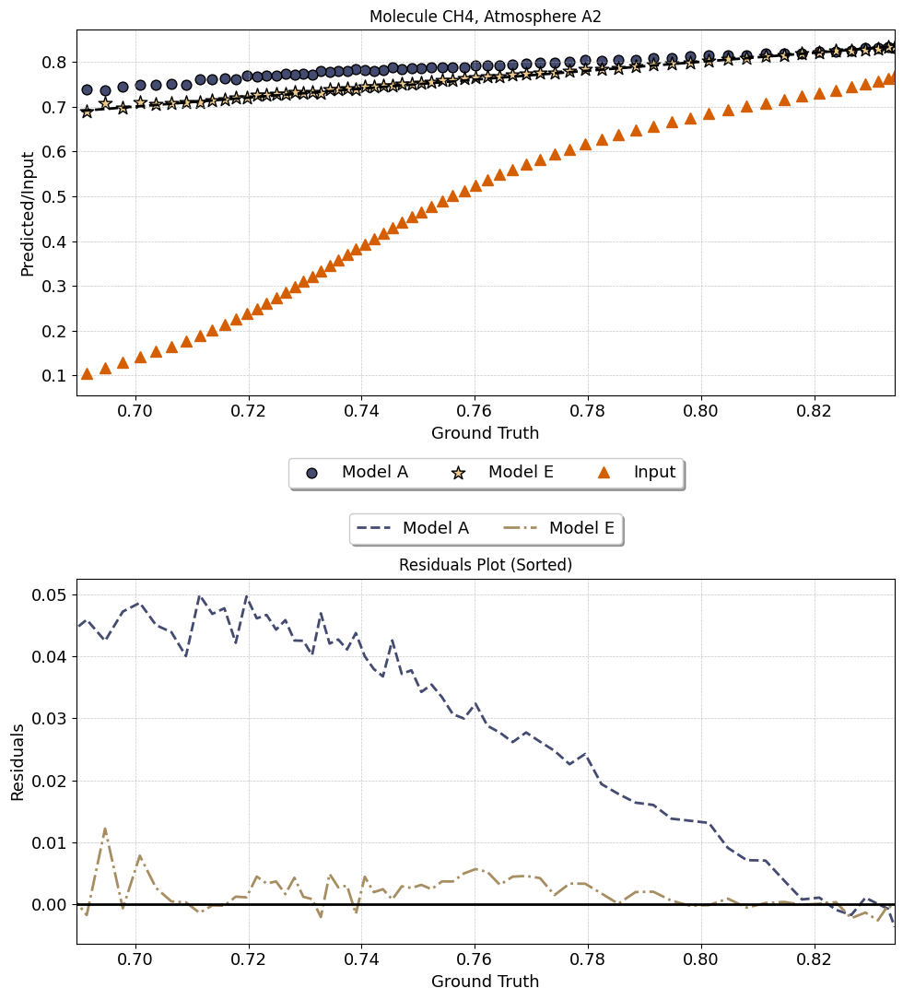

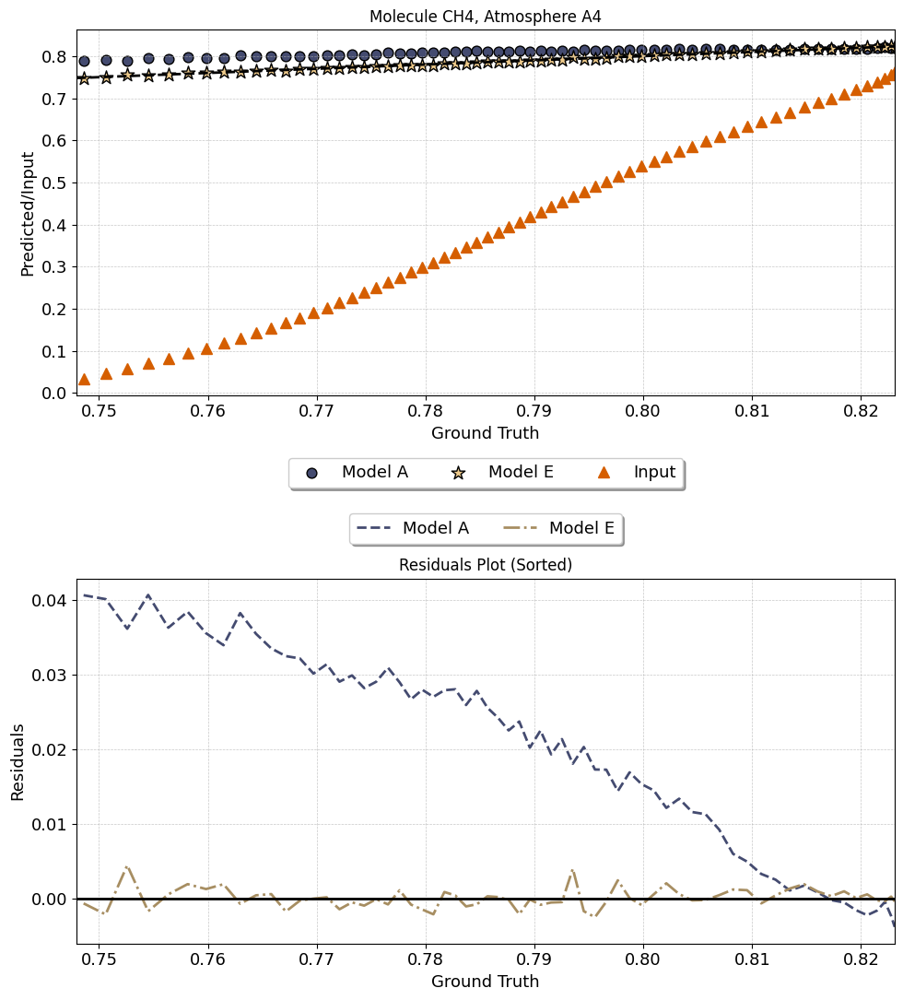

In [6]:
labels = ['Model A','Model E']
name = 'CH4'
for atm in [32, 1291]:
    gt_vs_predict_one_molecule_one_atmospheres(ground_truth, [network_output_simple,  network_output_dl8], 
                       network_input, atm, molecules.index(name), labels, configuration, name,
                                               index_atmosphere_dict )


In [ ]:
labels = ['Model A','Model E']
name = 'CH4'
for atm in index_atmosphere_dict.keys():
    gt_vs_predict_one_molecule_one_atmospheres(ground_truth, [network_output_simple,  network_output_dl8], 
                       network_input, atm, molecules.index(name), labels, configuration, name,
                                               index_atmosphere_dict )


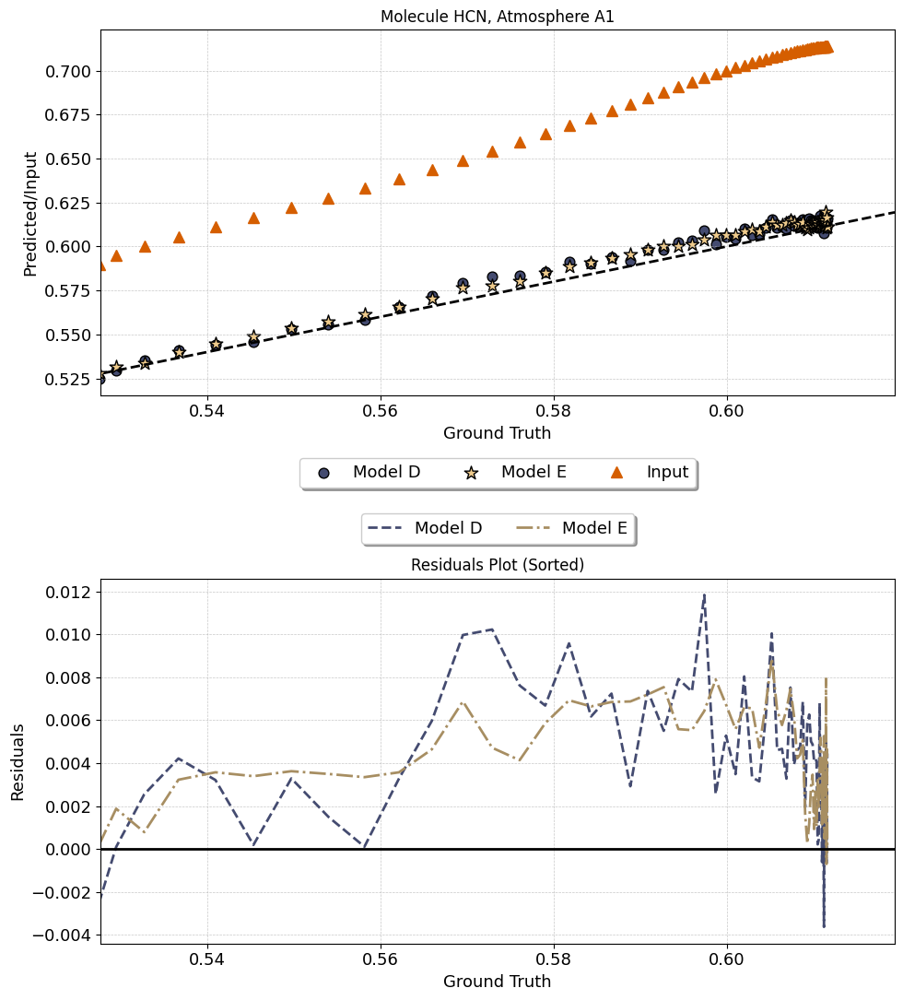

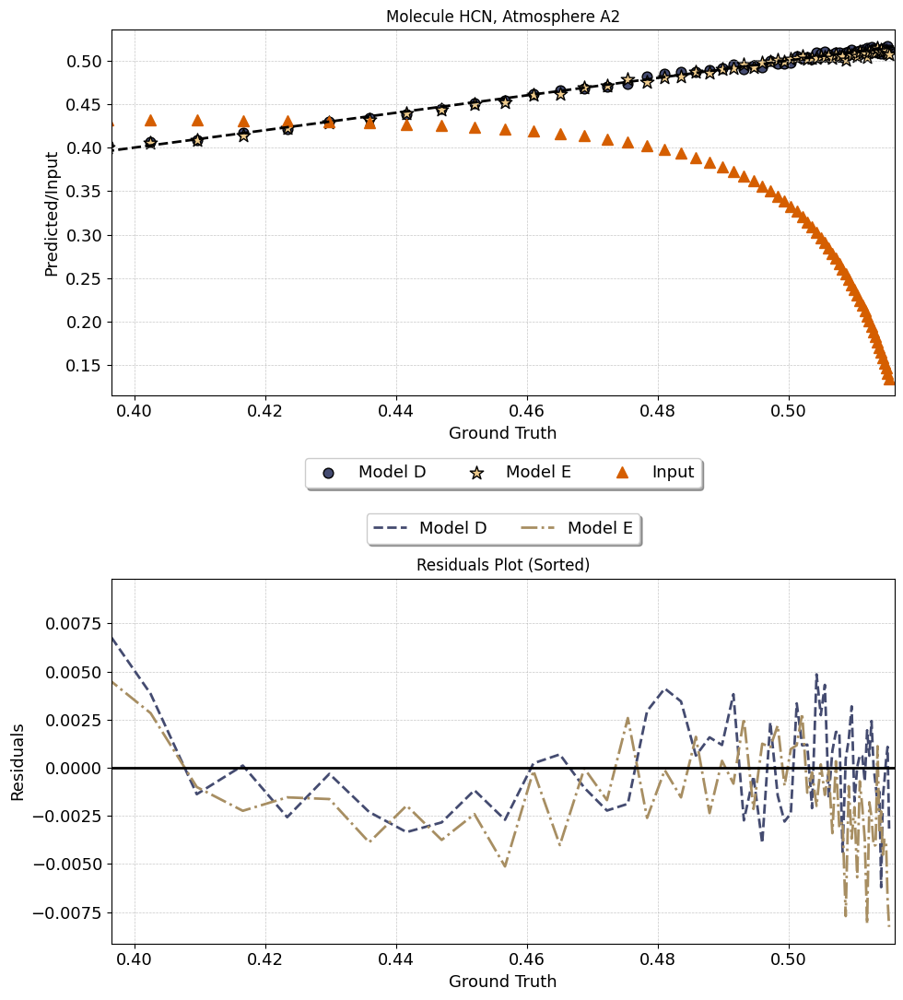

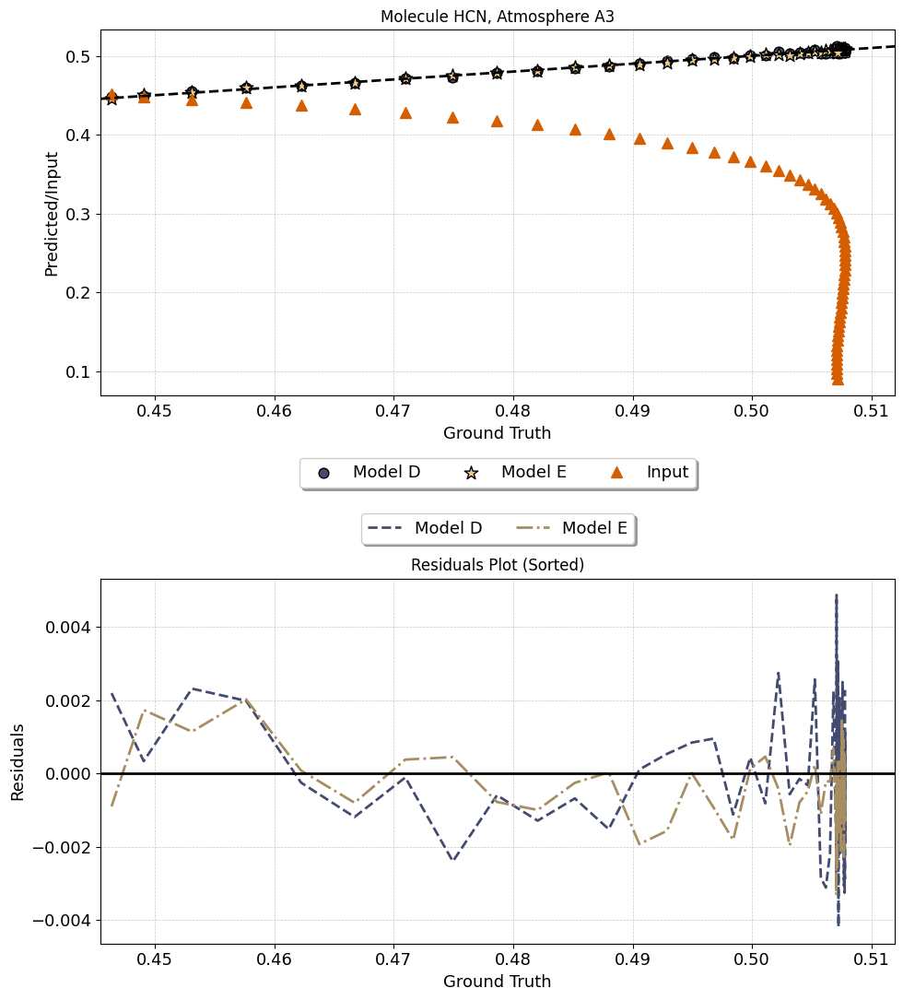

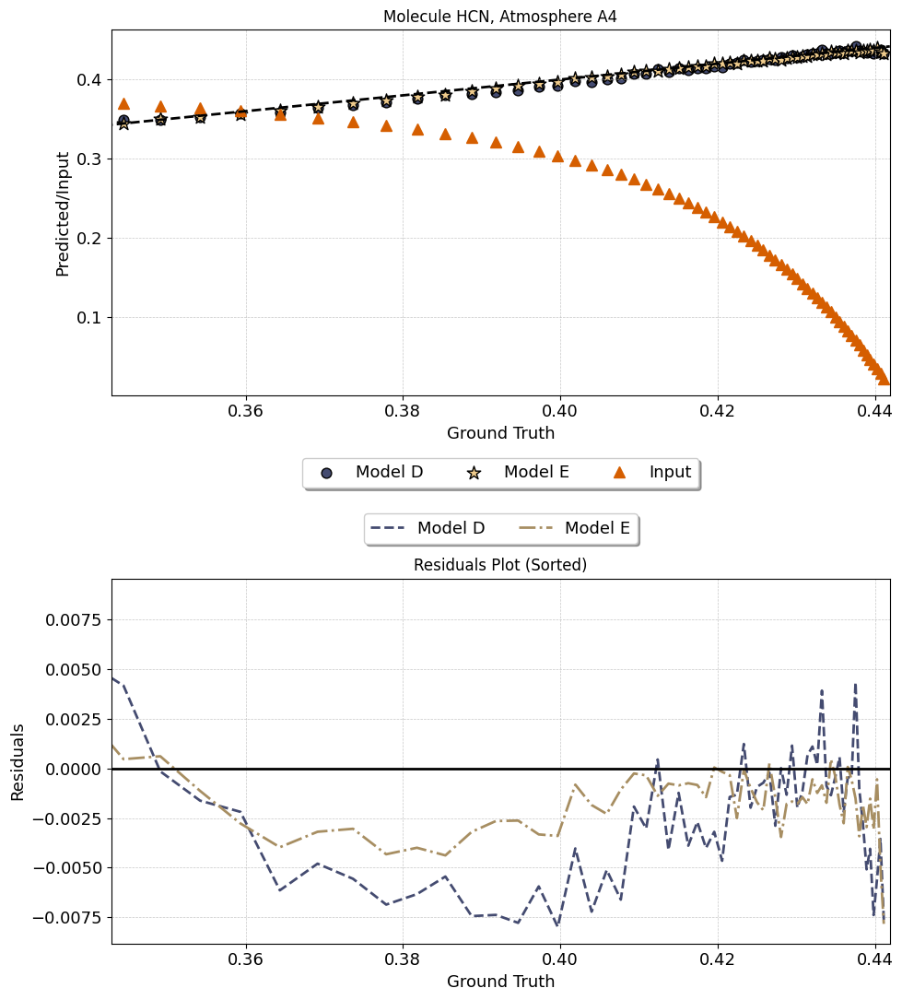

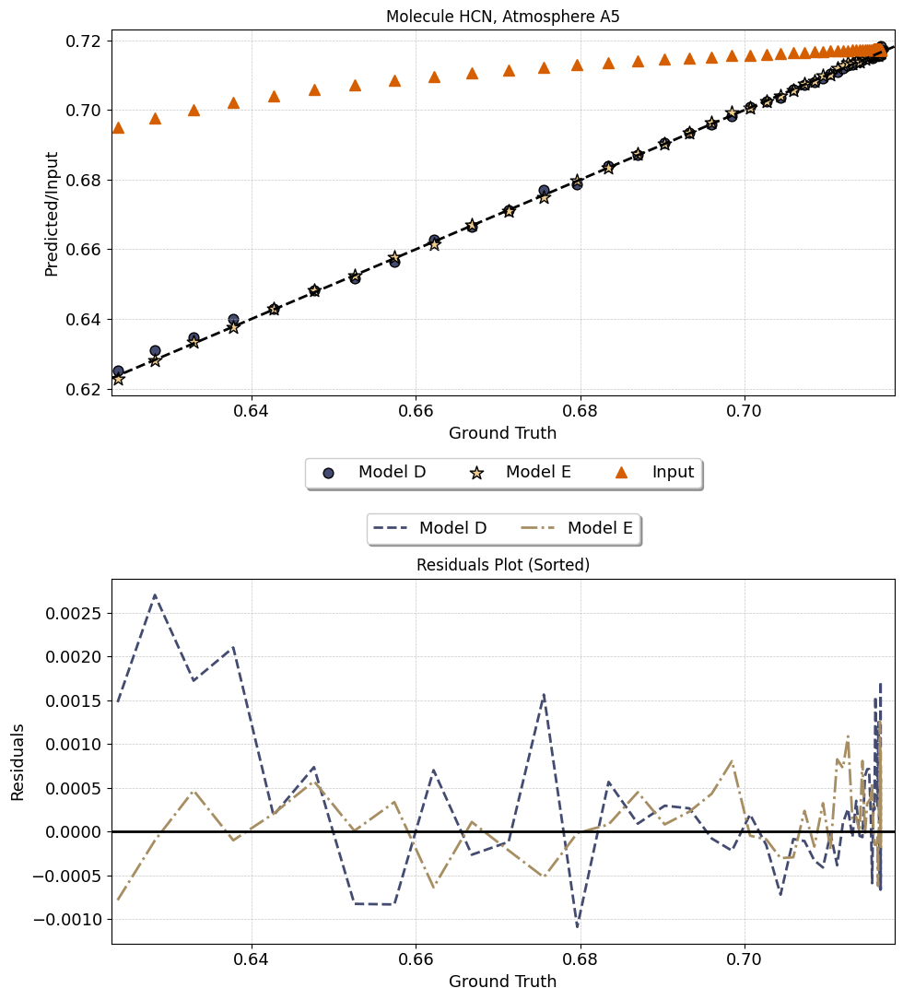

...

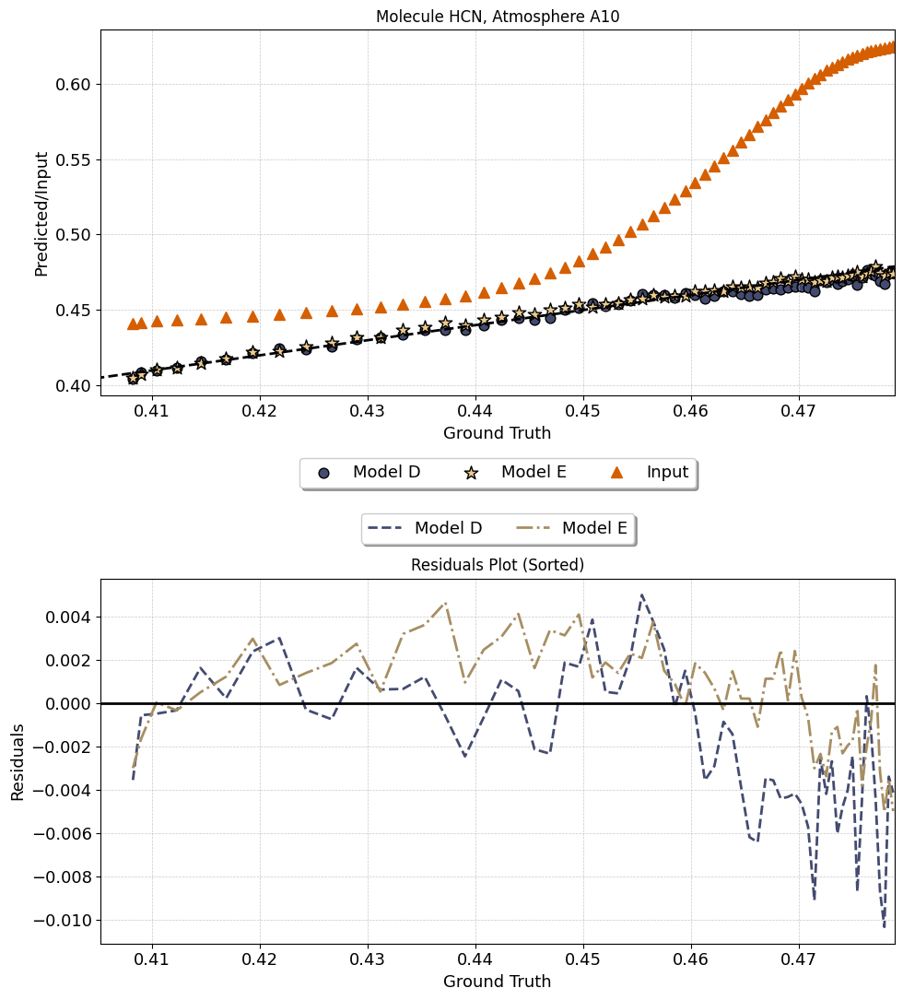

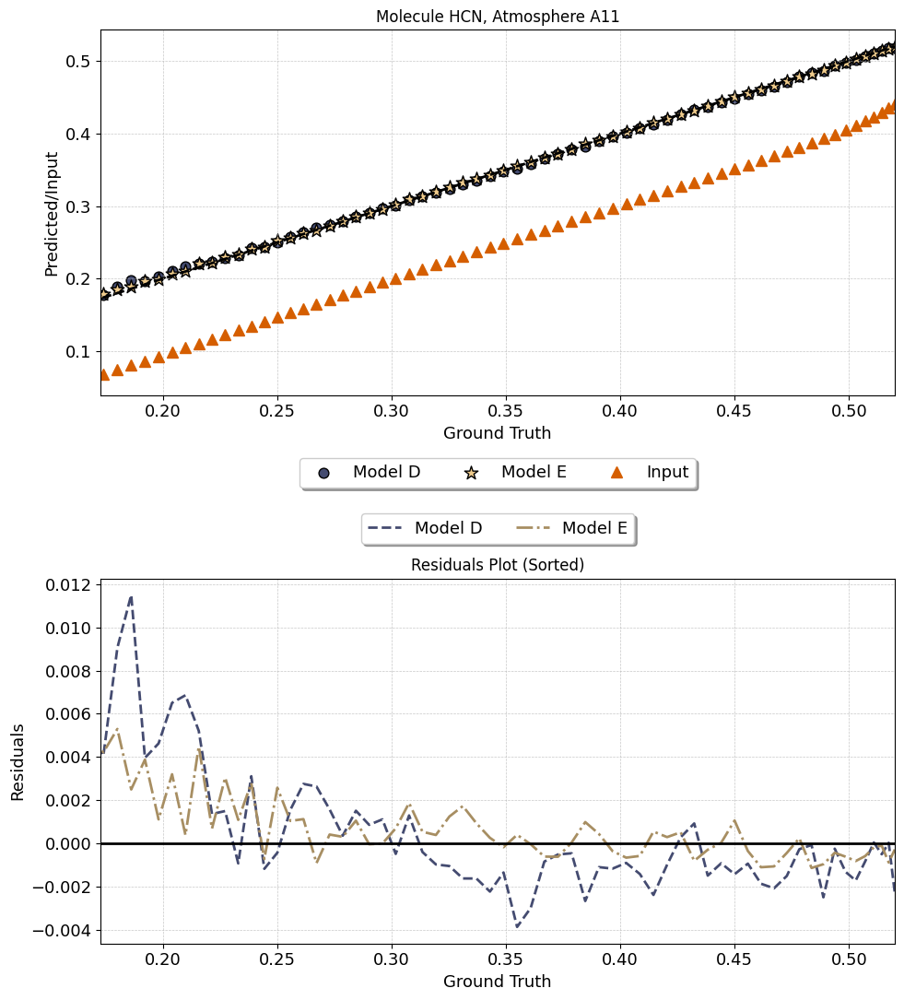

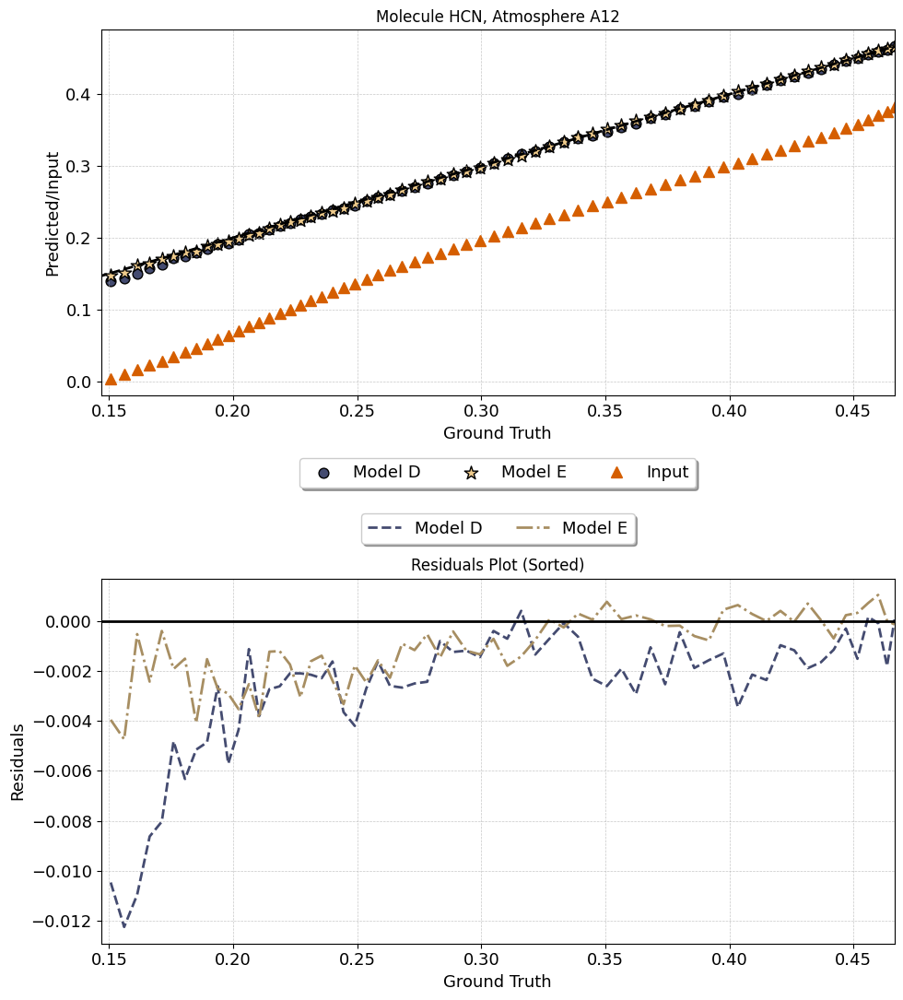

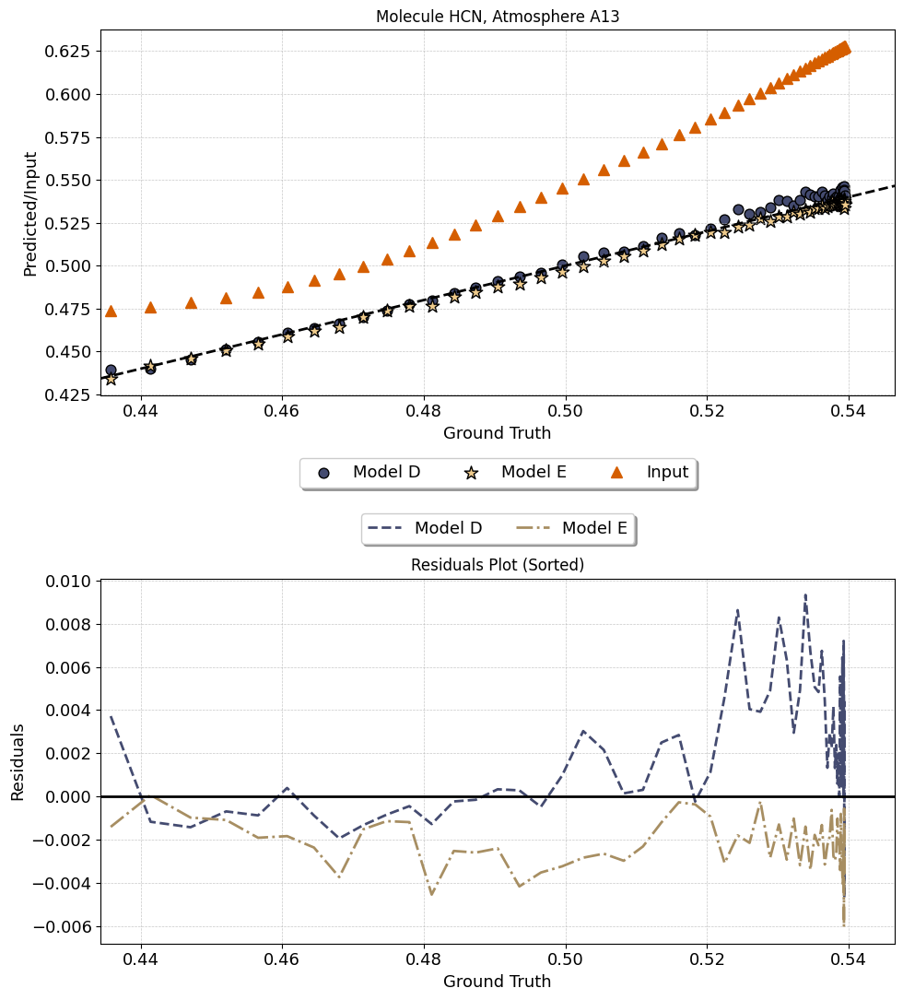

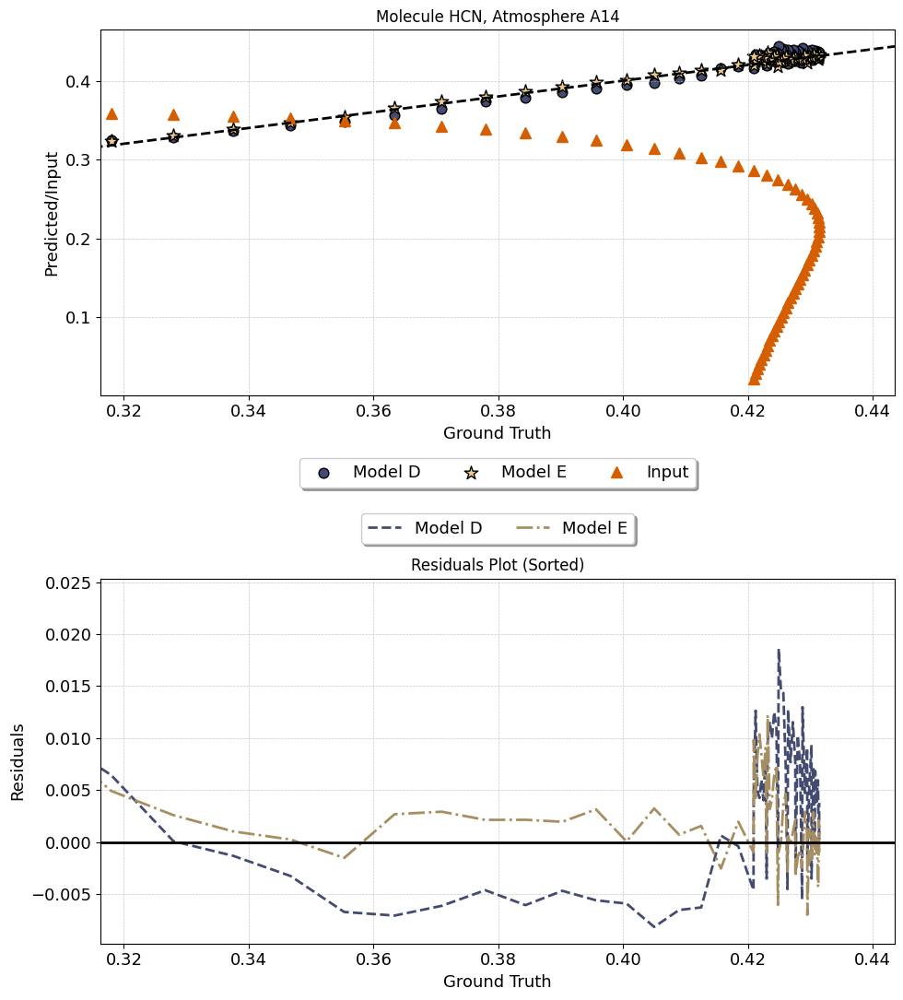

In [8]:
labels = ['Model D','Model E']
name = 'HCN'
for atm in index_atmosphere_dict.keys():
    gt_vs_predict_one_molecule_one_atmospheres(ground_truth, [network_output_dl16,network_output_dl8], 
                       network_input, atm, molecules.index(name), labels, configuration, name,
                                               index_atmosphere_dict )


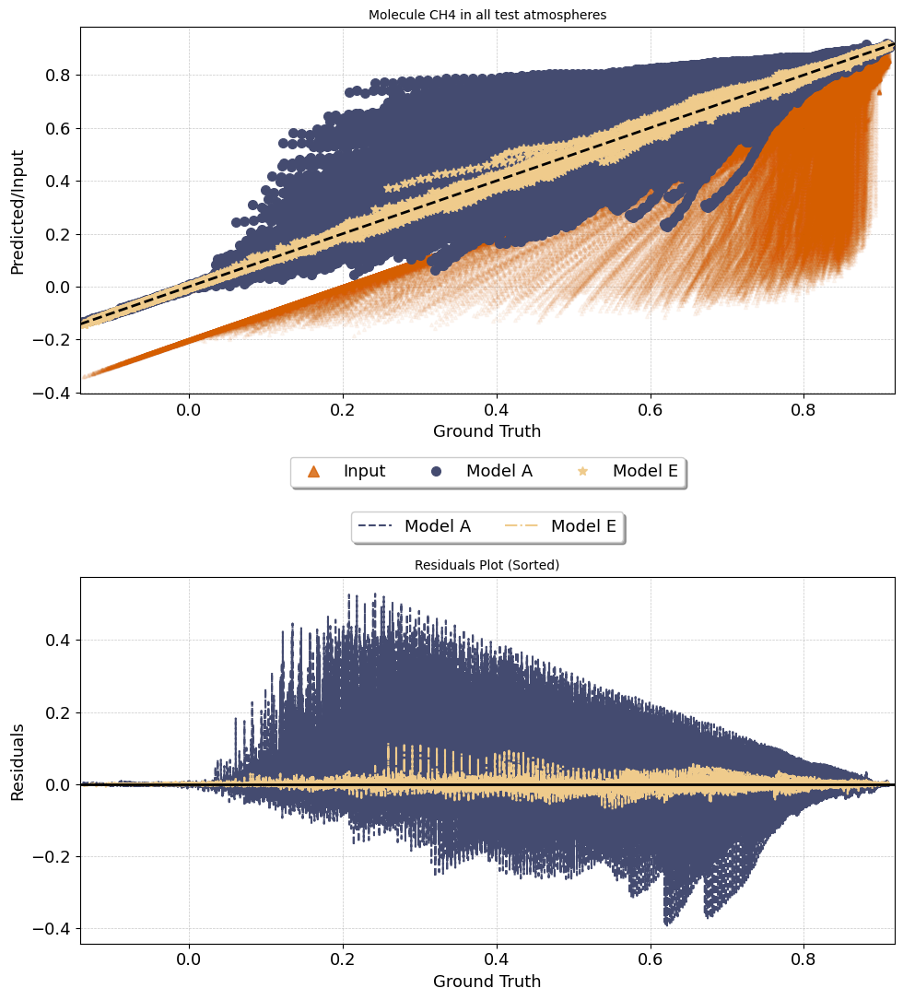

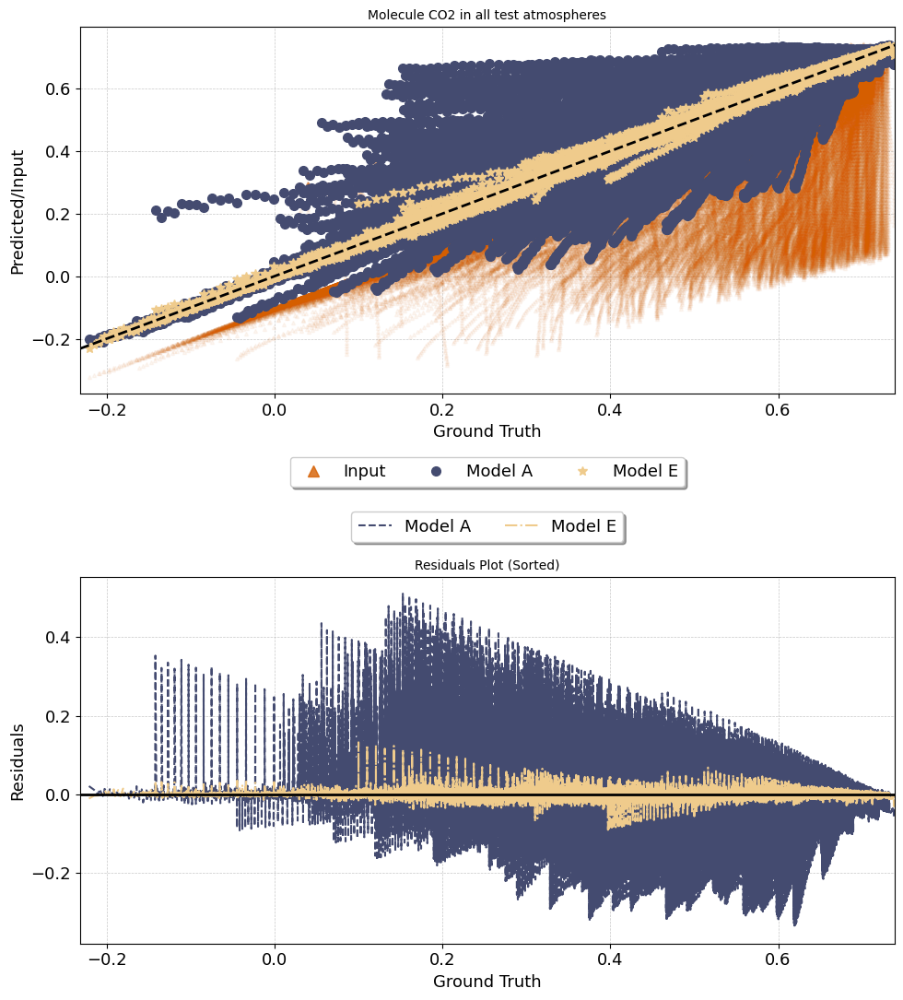

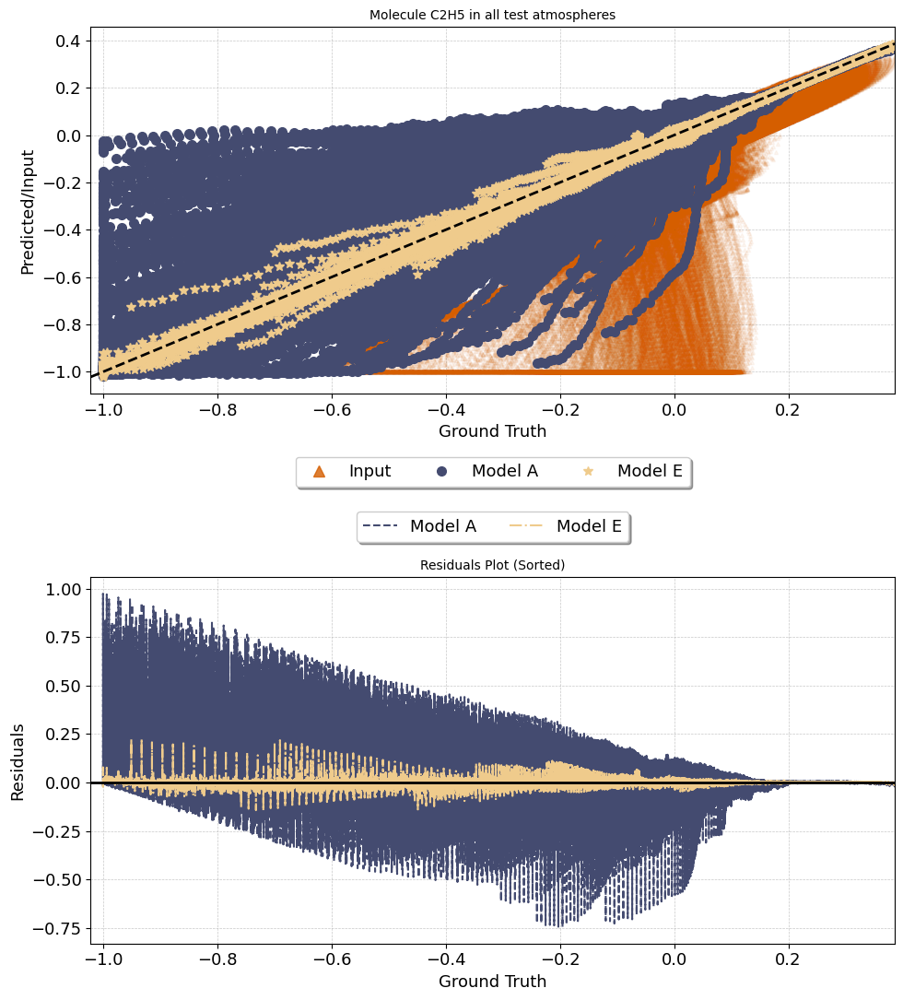

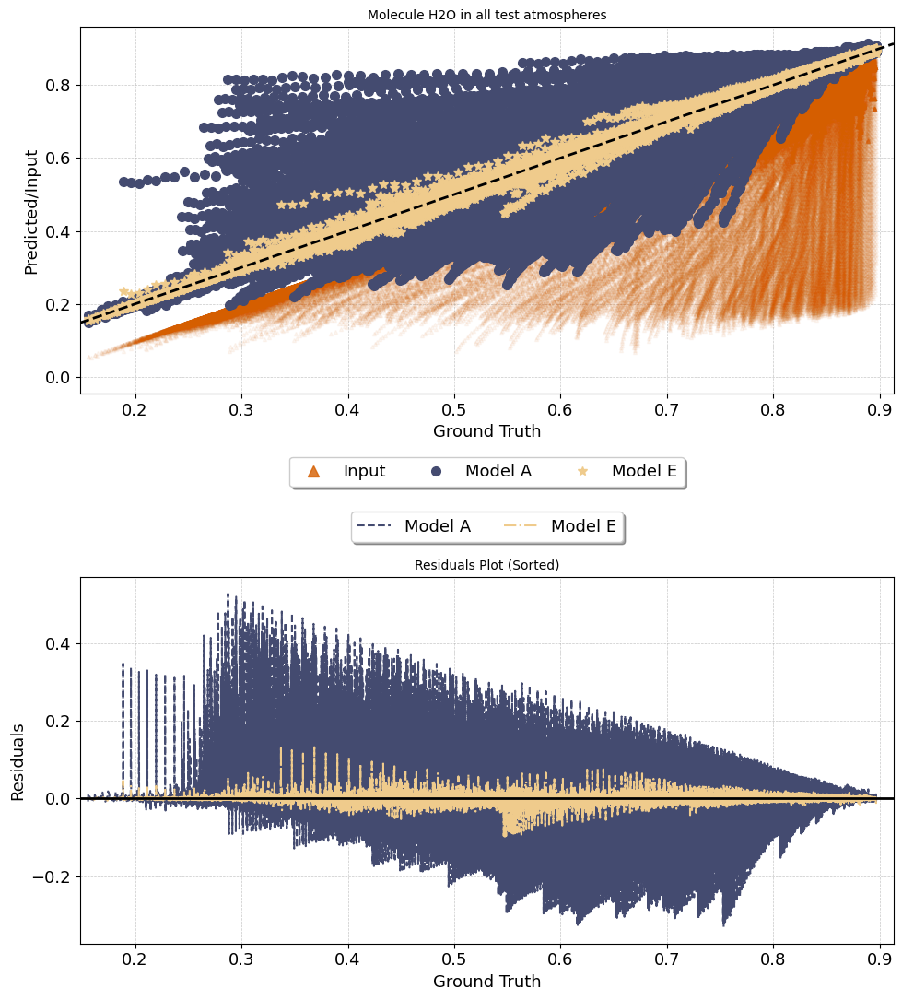

In [9]:
name = 'CH4'
labels = ['Model A','Model E']
gt_vs_predict_one_molecule_all_atmospheres(ground_truth, [network_output_simple,  network_output_dl8], 
                       network_input, molecules.index(name), labels, configuration, name)

name = 'CO2'
gt_vs_predict_one_molecule_all_atmospheres(ground_truth, [network_output_simple,  network_output_dl8], 
                       network_input, molecules.index(name), labels, configuration, name)

name = 'C2H5'
gt_vs_predict_one_molecule_all_atmospheres(ground_truth, [network_output_simple,  network_output_dl8], 
                       network_input, molecules.index(name), labels, configuration, name)

name = 'H2O'
gt_vs_predict_one_molecule_all_atmospheres(ground_truth, [network_output_simple,  network_output_dl8], 
                       network_input, molecules.index(name), labels, configuration, name)


name = 'C2N2'
#gt_vs_predict_one_molecule_all_atmospheres(ground_truth, [network_output_simple,  network_output_dl8], 
            #           network_input, molecules.index(name), labels, configuration, name)

name = 'HCN'
#gt_vs_predict_one_molecule_all_atmospheres(ground_truth, [network_output_simple,  network_output_dl8], 
                      # network_input, molecules.index(name), labels, configuration, name)

# Calculate statistics per molecule (MAE, MSE, STD, MAPE, KL)

In [10]:
def calculate_metrics(network_prediction, ground_truth, molecules):
    # Initialize dictionaries to store flattened predictions and ground truth for each molecule
    molecule_dict_pred = {}
    molecule_dict_gt = {}
    
    # Process predictions
    for molecule_idx in range(len(molecules)):
        examples = network_prediction[:, molecule_idx, :].flatten()
        molecule_dict_pred[molecules[molecule_idx]] = examples.tolist()
        
    # Convert predictions dictionary to DataFrame
    df_pred = pd.DataFrame(molecule_dict_pred).T
    
    # Process ground truth
    for molecule_idx in range(len(molecules)):
        examples = ground_truth[:, molecule_idx, :].flatten()
        molecule_dict_gt[molecules[molecule_idx]] = examples.tolist()
        
    # Convert ground truth dictionary to DataFrame
    df_gt = pd.DataFrame(molecule_dict_gt).T
    
    # Calculate MAE and MSE
    mae = (df_pred - df_gt).abs().mean(axis=1)
    mse = ((df_pred - df_gt) ** 2).mean(axis=1)
    
    # Calculate STD for predictions
    std_df = df_pred.std(axis=1)
    
    # Initialize dictionaries for MAPE and KL Divergence
    mape_dict = {}
    kl_divergence_dict = {}
    
    epsilon = 2  # Small number to avoid division by zero
    
    # Calculate MAPE and mean KL divergence for each molecule
    for molecule in df_pred.index:
        network_output_molecule = np.array(df_pred.loc[molecule])
        ground_truth_molecule = np.array(df_gt.loc[molecule])
        
        # Calculate MAPE
        mape = np.mean(np.abs((network_output_molecule - ground_truth_molecule) / 
                              (ground_truth_molecule + 1e-10))) * 100
        mape_dict[molecule] = mape
        
        # Calculate KL Divergence
        gt_dist = ground_truth_molecule + epsilon
        no_dist = network_output_molecule + epsilon
        gt_normalized = gt_dist / np.sum(gt_dist)
        no_normalized = no_dist / np.sum(no_dist)
        kl_divergence = entropy(no_normalized, gt_normalized)
        kl_divergence_dict[molecule] = kl_divergence
    
    # Convert MAPE and KL Divergence dictionaries to Series
    mape_series = pd.Series(mape_dict, name='MAPE')
    kl_div_series = pd.Series(kl_divergence_dict, name='KL Div')
    
    # Combine all metrics into one DataFrame
    metrics_df_network_output = pd.DataFrame({
        'MAE': mae,
        'MSE': mse,
        'STD': std_df,
        'MAPE': mape_series,
        'KL Div': kl_div_series
    })
    metrics_df_network_output = metrics_df_network_output.applymap(tidy_values)
    
    return metrics_df_network_output

In [11]:
metrics_df_DL_ds8 = calculate_metrics(network_output_dl8, ground_truth, molecules)
metrics_df_simple = calculate_metrics(network_output_simple, ground_truth, molecules)
metrics_df_input = calculate_metrics(network_input, ground_truth, molecules)

In [12]:
metrics_df_simple.columns = pd.MultiIndex.from_product([['Model A'], metrics_df_simple.columns])
metrics_df_DL_ds8.columns = pd.MultiIndex.from_product([['Model E'],
                                                        metrics_df_DL_ds8.columns])
combined_metrics_df = pd.concat([ metrics_df_simple, metrics_df_DL_ds8], axis=1)
combined_metrics_df.to_csv('Appendix_table_ModelAE.csv')

In [13]:
def layer_molecule_wise_error_comparison(network_output, ground_truth, labels, name = None):
    plt.figure(figsize=(6, 10))
    colors = ['red', 'blue','green', '#009E73', '#F0E442']
    for net, lab,i in zip(network_output, labels,np.arange(len(labels))):
        layer_wise_error = np.mean(np.abs(net - ground_truth), axis=(0, 1))  # Mean error per layer
        molecule_wise_error = np.mean(np.abs(net - ground_truth), axis=(0, 2))  # Mean error per molecule

        plt.subplot(2, 1, 1)
        plt.plot(layer_wise_error, label=lab, color = colors[i])
        plt.title('Layer-wise Mean Absolute Error')
        plt.xlabel('Layer')
        plt.ylabel('MAE')
        plt.grid(True, linestyle='--', alpha=0.7)  

        plt.subplot(2, 1, 2)
        plt.plot(molecule_wise_error, label=lab, color = colors[i])
        plt.title('Molecule-wise Mean Absolute Error')
        plt.xlabel('Molecule')
        plt.ylabel('MAE')
        plt.grid(True, linestyle='--', alpha=0.7)  

    plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.3), fancybox=True, shadow=True, ncol=3)
    
    plt.tight_layout()
    if name:
        plt.savefig(f'{name}.png', dpi=300,bbox_inches='tight')
    plt.show()  

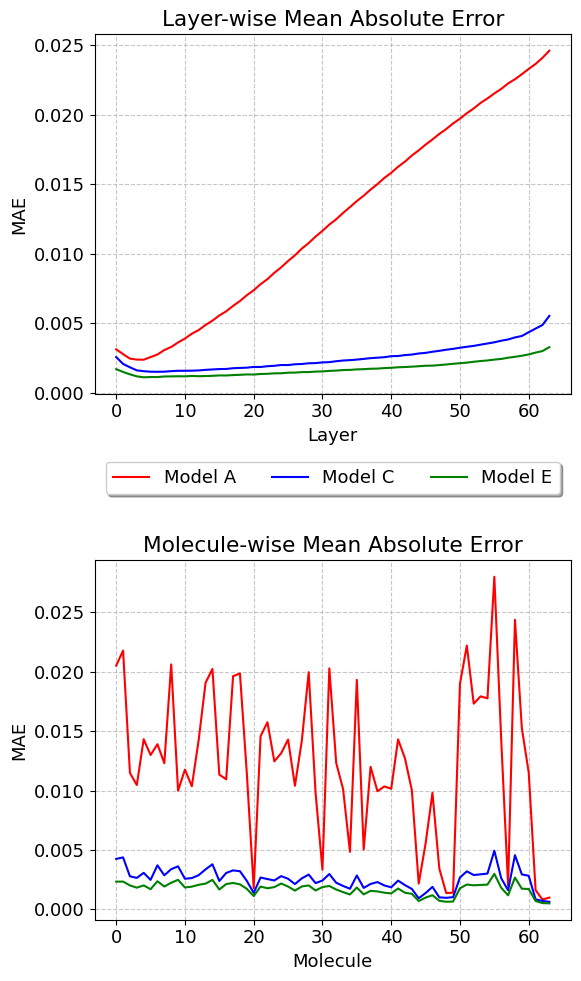

In [14]:
n_colors = 100
cmap = mcolors.LinearSegmentedColormap.from_list("CustomCmap", ['#444B70', '#6FAEB7', '#F4EBAB', '#E8A065'],
                                                 N=n_colors)
colors = cmap(np.linspace(0, 1, len(labels)))


labels = ['A','C','E']
labels = ['Model A','Model C', 'Model E']
nets = [network_output_simple, network_output_att, network_output_att_addinf, network_output_dl16,
        network_output_dl8, network_input]
nets = [network_output_simple,  network_output_att_addinf,  network_output_dl8]
layer_molecule_wise_error_comparison(nets, ground_truth, labels, name='layer_molecule_err_ACE')

In [15]:
def statistic_plot(df):
    plt.figure(figsize=(12, 8))

    plt.subplot(231)
    df.min().plot(kind = 'hist',bins=20, color='#6FAEB7')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title('Minimum')

    plt.subplot(232)
    df.max().plot(kind = 'hist',  bins=20, color='#6FAEB7')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title('Maximum')

    plt.subplot(233)
    df.std().plot(kind = 'hist',  bins=20, color='#6FAEB7')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Standard Deviation')

    plt.subplot(234)
    df.mean().plot(kind = 'hist', bins=20, color='#6FAEB7')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Mean')

    plt.subplot(235)
    df.median().plot(kind = 'hist', bins=20, color='#6FAEB7')
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.title(f'Median')
    
    plt.tight_layout()
    plt.show()

Statistic per molecule separately for individual examples
C2N2


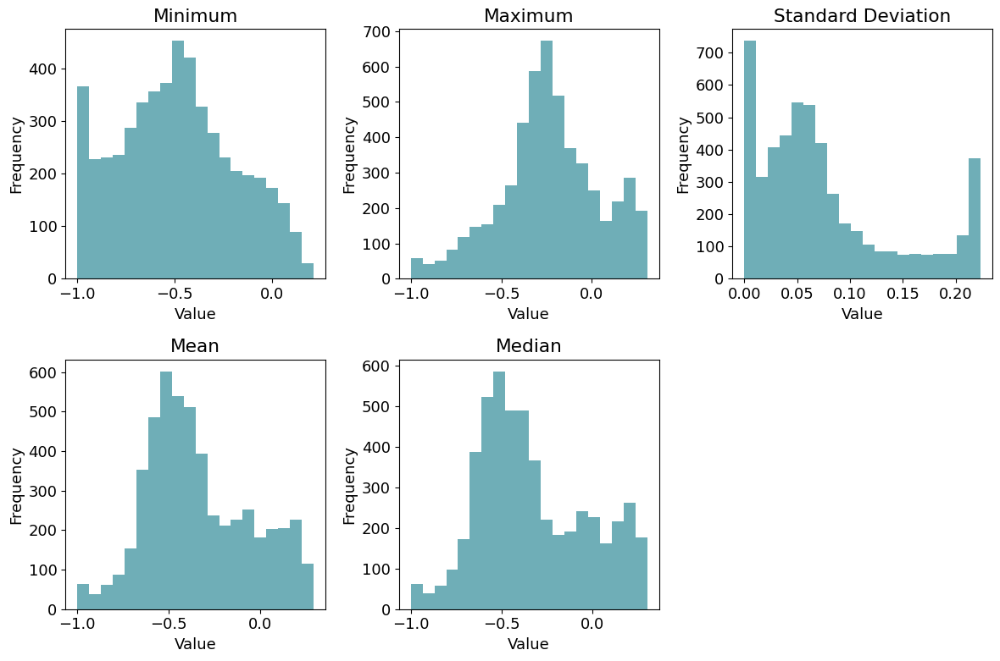

NO


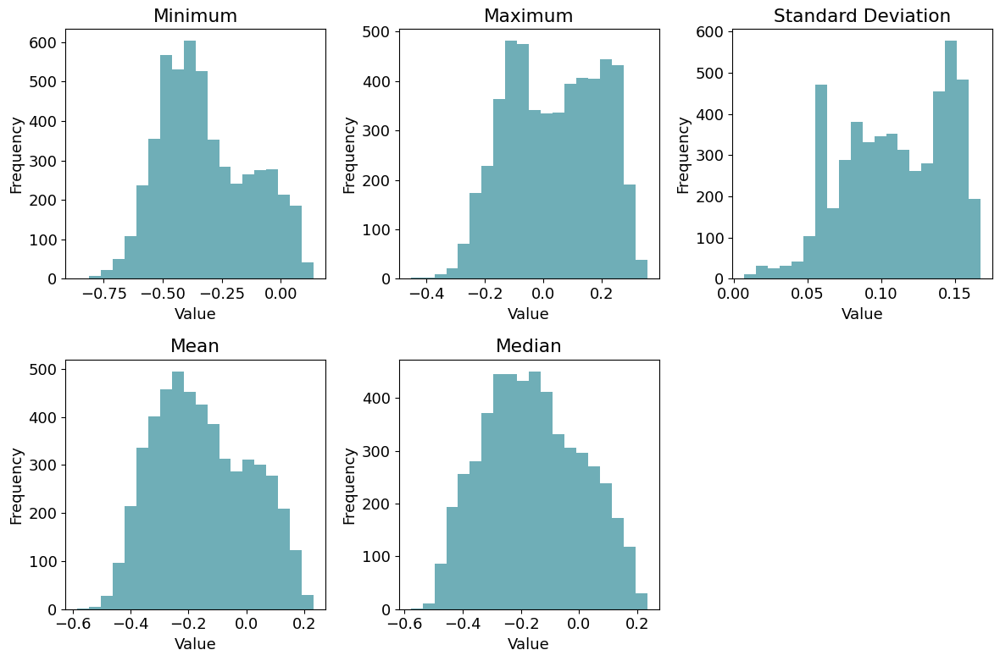

C2H4


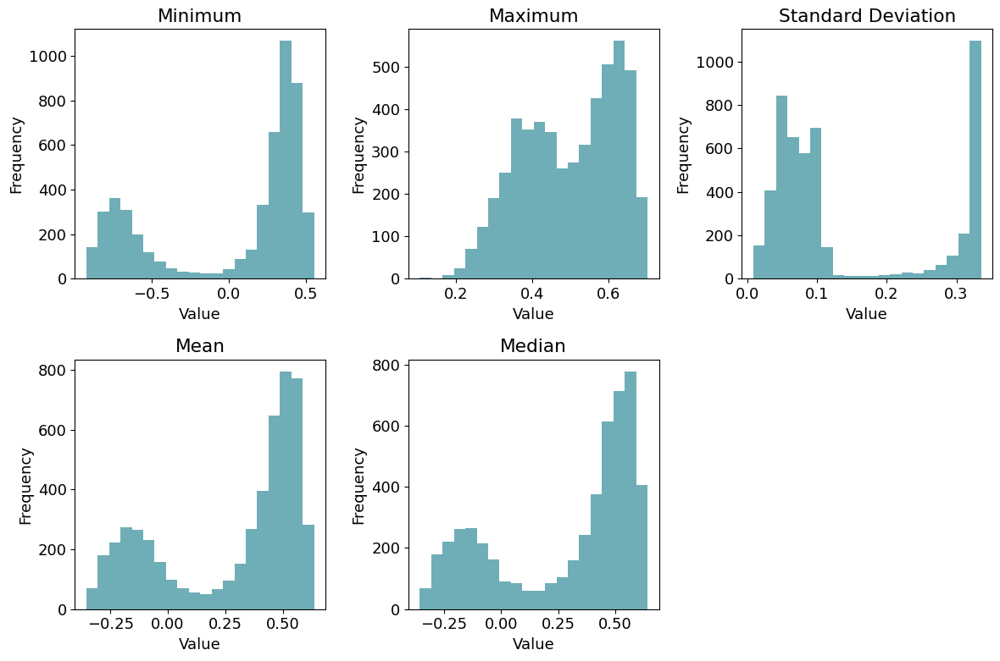

C2H2


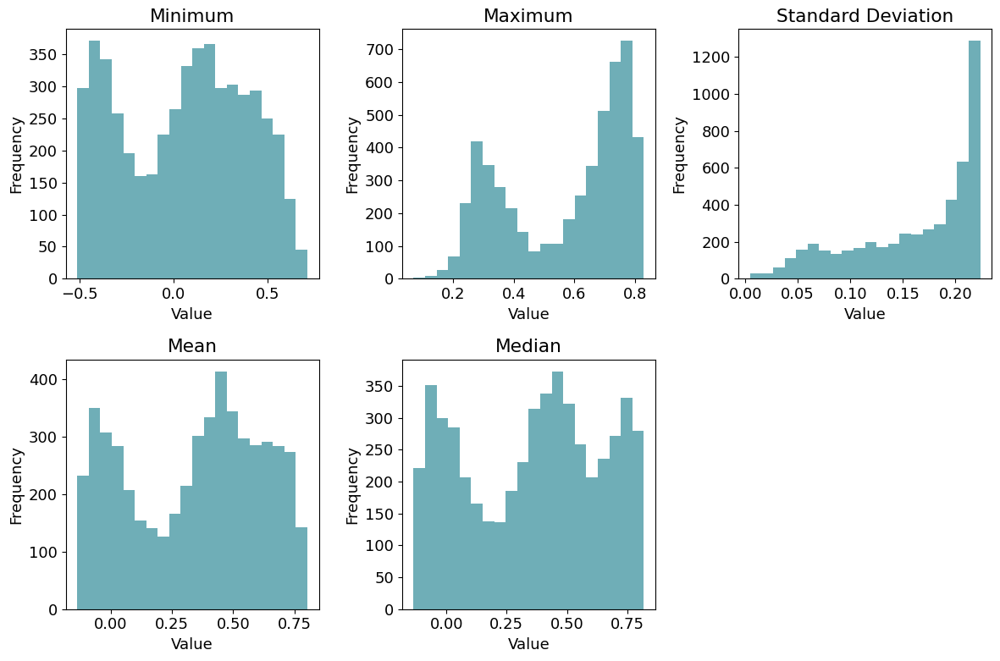

H2CO


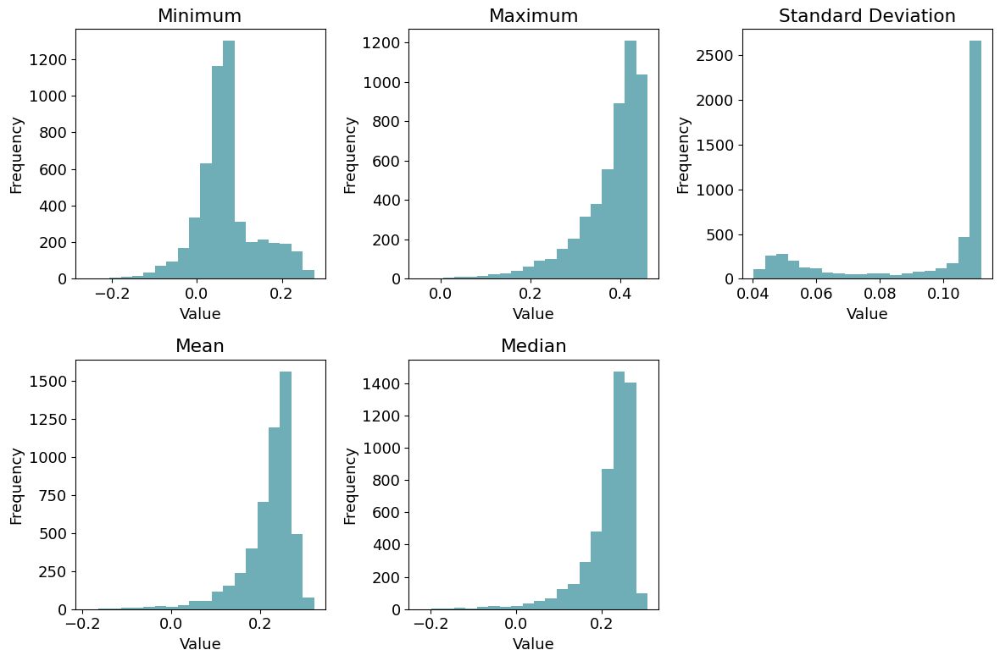

CO2


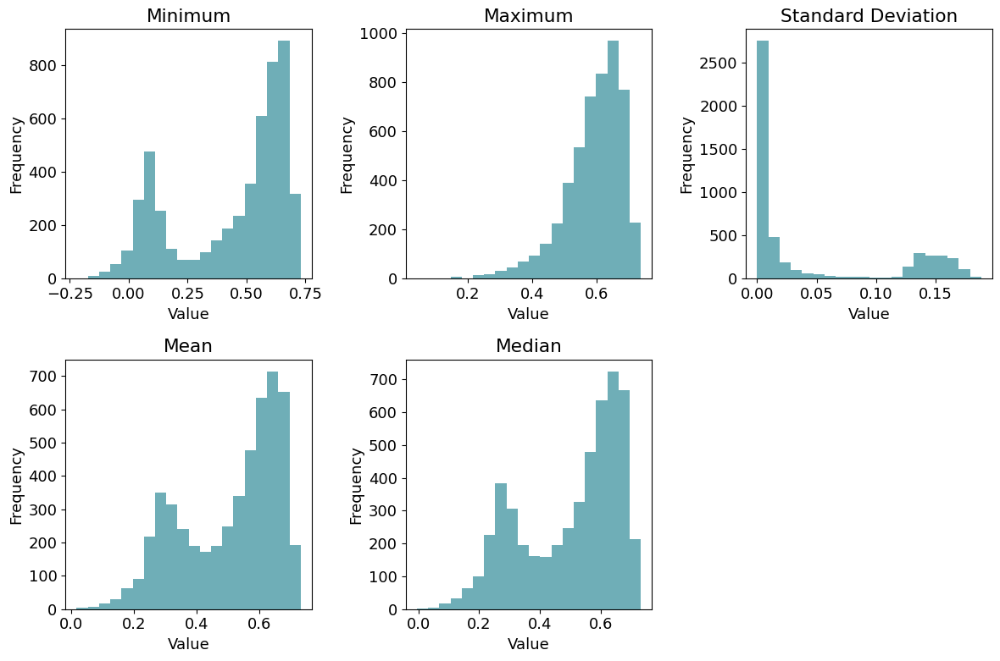

OH


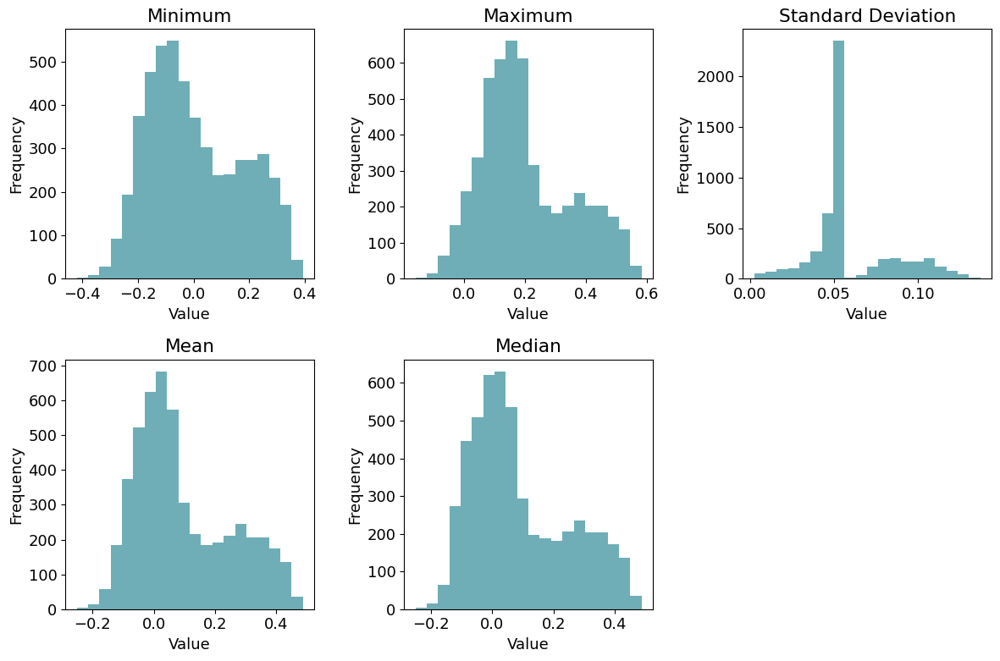

HCN


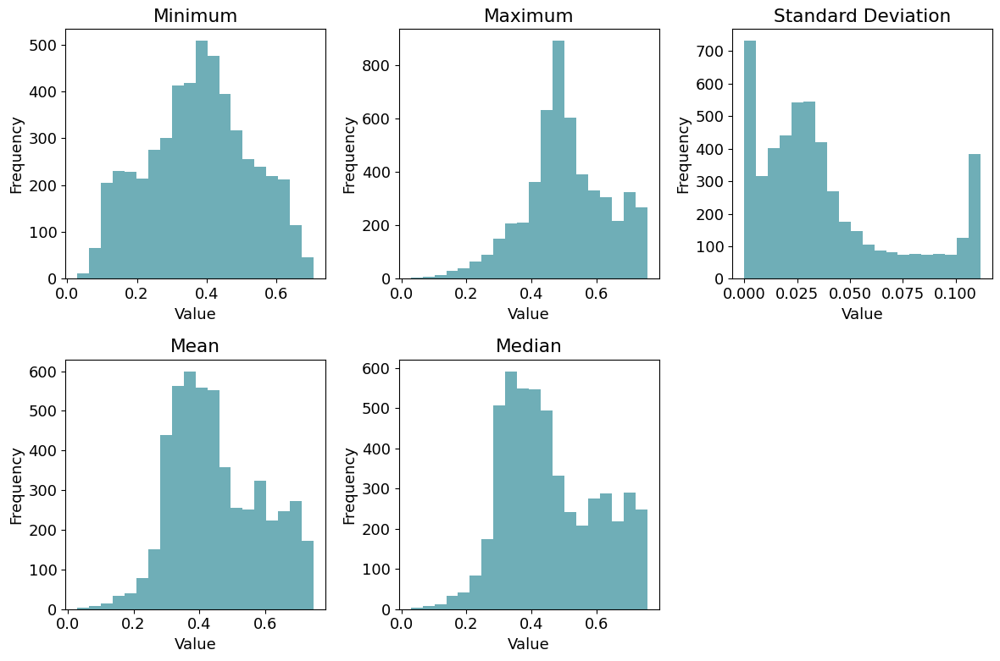

NH3


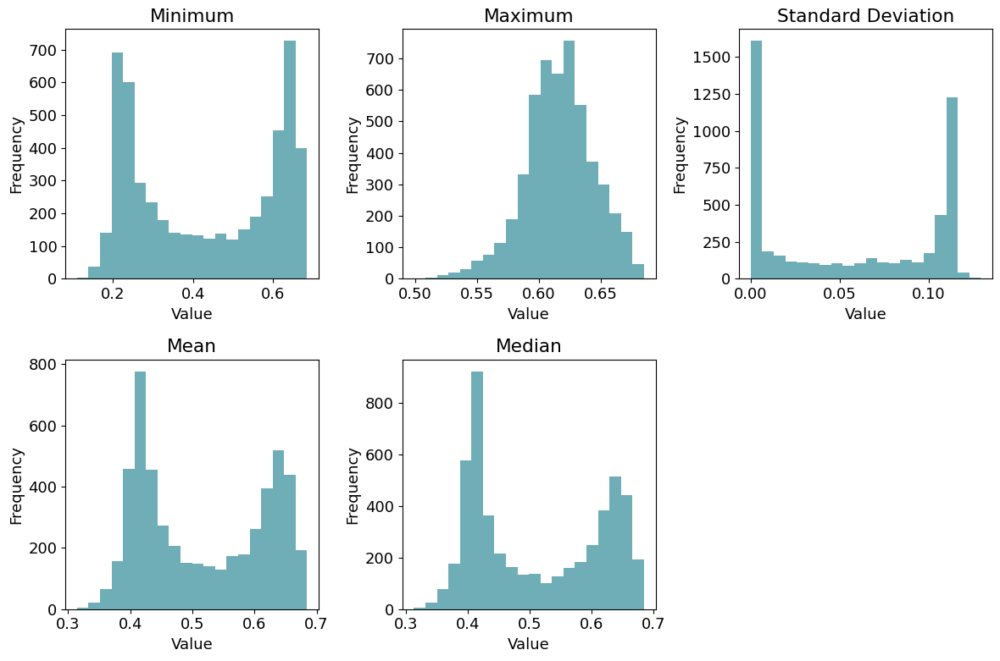

CH4


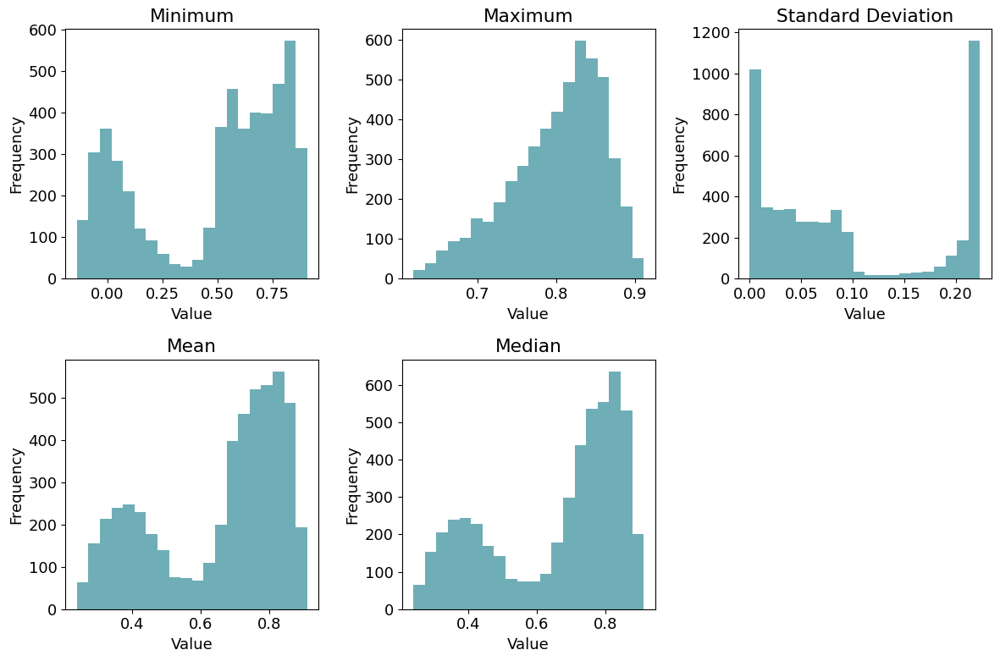

N2


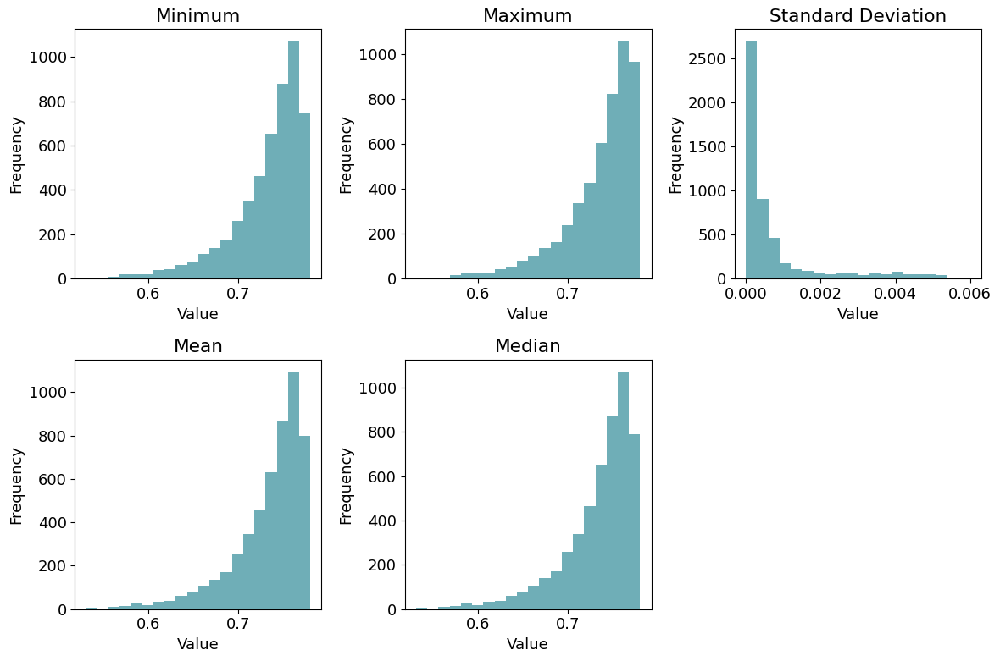

CO


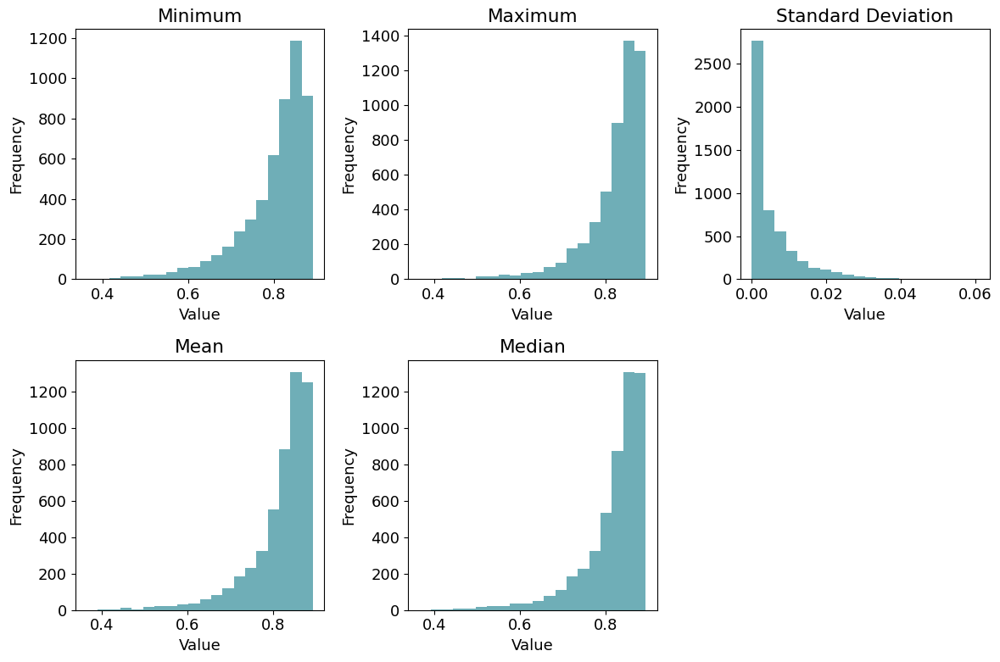

H2O


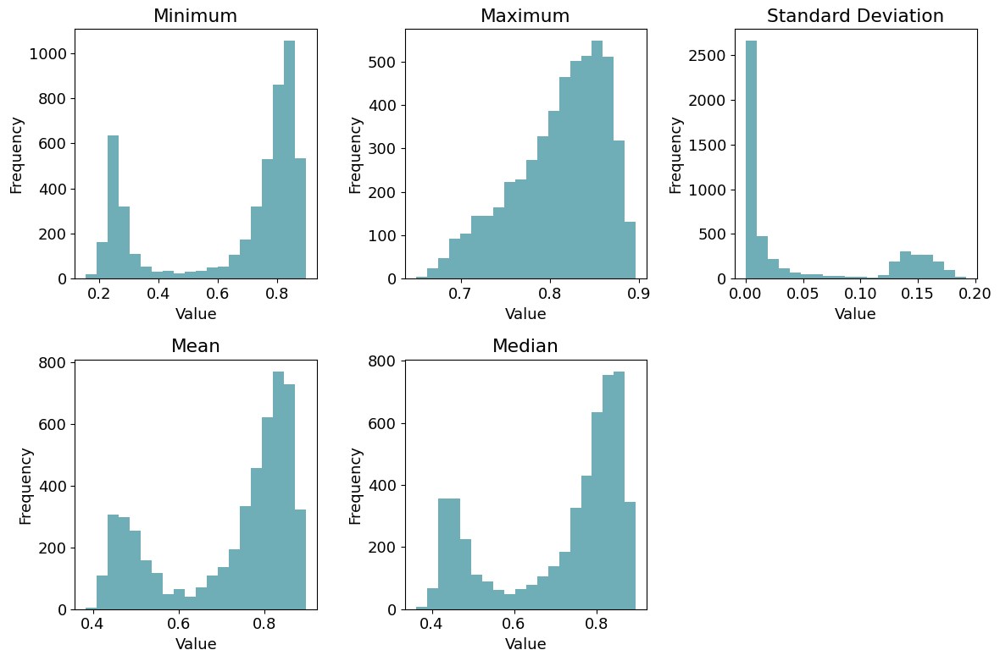

H


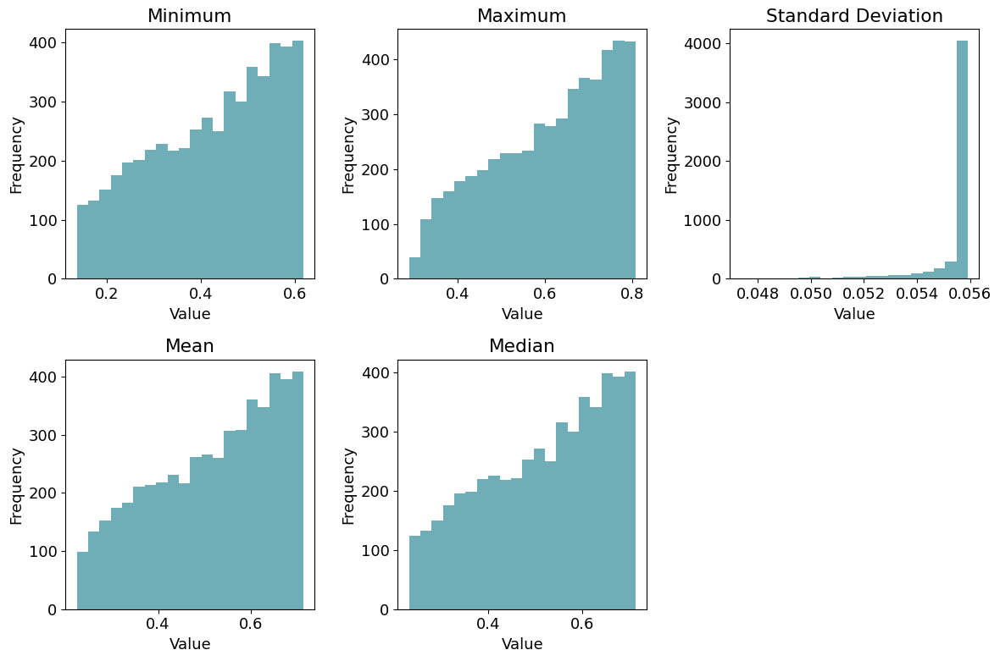

H2


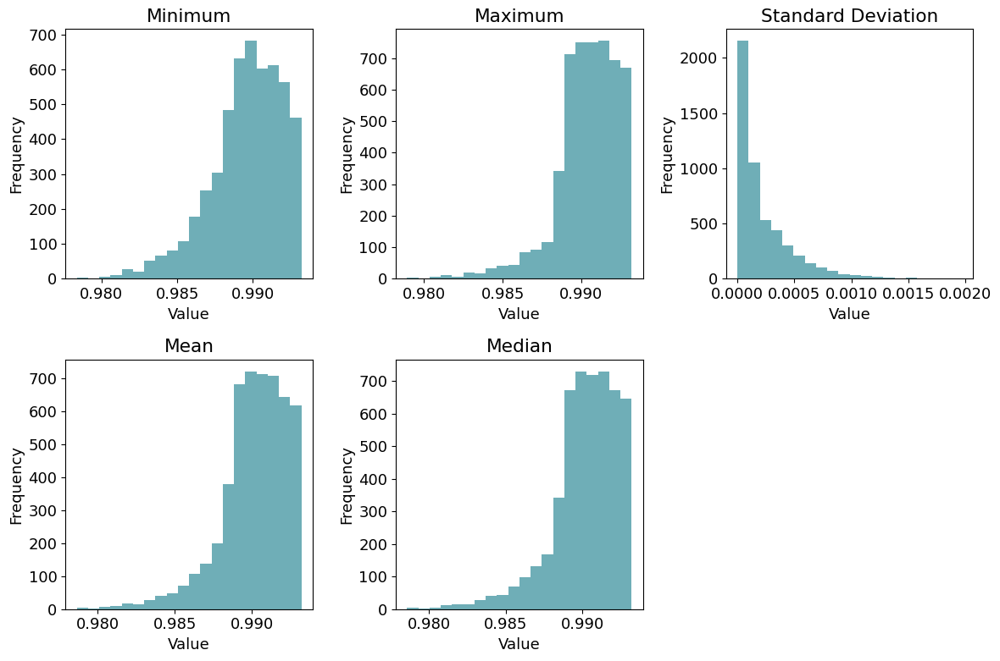

He


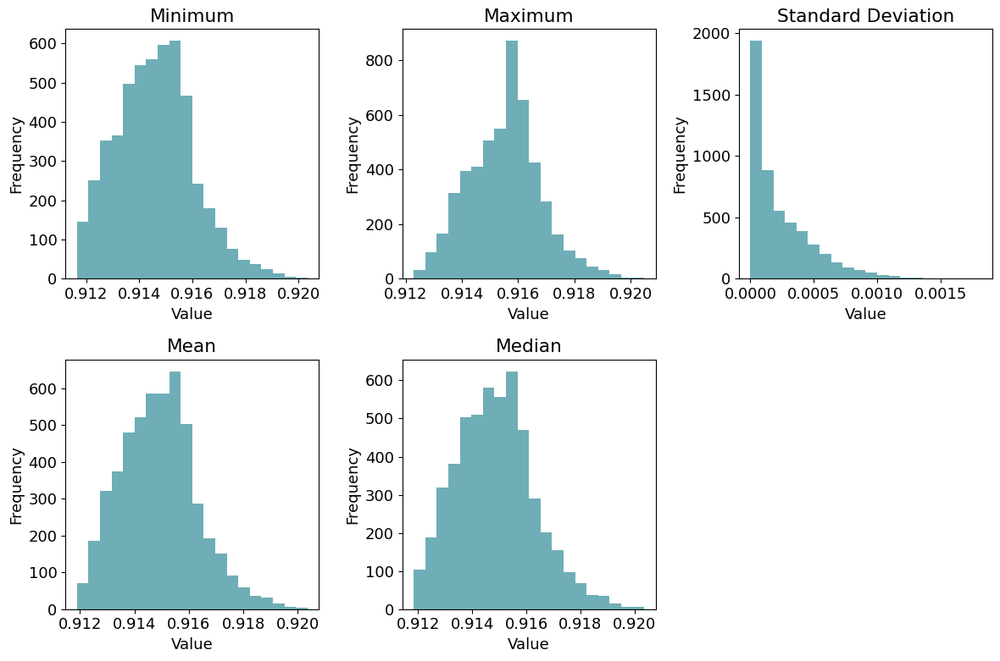

In [16]:
print('Statistic per molecule separately for individual examples')
for name in ['C2N2','NO','C2H4','C2H2','H2CO','CO2','OH','HCN','NH3','CH4','N2','CO','H2O','H','H2','He']:
    print(name)
    df_molecule = pd.DataFrame(ground_truth[:,molecules.index(name),:].T)
    statistic_plot(df_molecule)

In [17]:
bars = convert_pascals_to_bars(pressure)

# Plot Volume Mixing Ratio vs Pressure

# Equilibrium and Disequilibrium

In [18]:
def logVMR_vs_pressure_equlibrium_disequilibrium(network_input, ground_truth, n, chosen_molecules,
                                            pascals_values, save=False):
    
    co,m,t= configuration.loc[n][['co_ratio','metalicity','isothermal_T']]
    

    bars_values = convert_pascals_to_bars(pascals_values)
    custom_handles = []
    fig, ax = plt.subplots(figsize=(8, 6))
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']

    for i, mol in enumerate(chosen_molecules):
        color = colors[i % len(colors)]
        ax.plot(inverse_preprocessing(network_input[n, molecules.index(mol), :]), bars_values, '-.',
                label=mol,lw=2, color=color)
        ax.plot(inverse_preprocessing(ground_truth[n, molecules.index(mol), :]), bars_values, '-',
                lw=1.5, color=color)
        custom_handles.append(mlines.Line2D([], [], color=color, linestyle='-', linewidth=1.5, label=mol))
    ax.set_yscale('log')
    ax.invert_yaxis()

   
    ax.grid(alpha=0.3)
    ax.set_title(f'Atmosphere {index_atmosphere_dict[n]}')
    
    ax.set_xlabel('Log (Volume Mixing Ratio)', fontsize=11)
    ax.set_ylabel('Pressure (bars)',fontsize=11)

    # Define custom lines for the legend here
    line_input = mlines.Line2D([], [], color='black', linestyle='-.', linewidth=1.5, label='Equilibrium')
    line_truth = mlines.Line2D([], [], color='black', linestyle='-', linewidth=1.5, label='Disequilibrium')
    custom_handles.extend([line_input, line_truth])
    ax.legend(handles=custom_handles, loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=5, fontsize=11)

    plt.tight_layout()

    if save:
        plt.savefig(f'Atmosphere_equilibrium_diseq_{n}.png')
    plt.show()

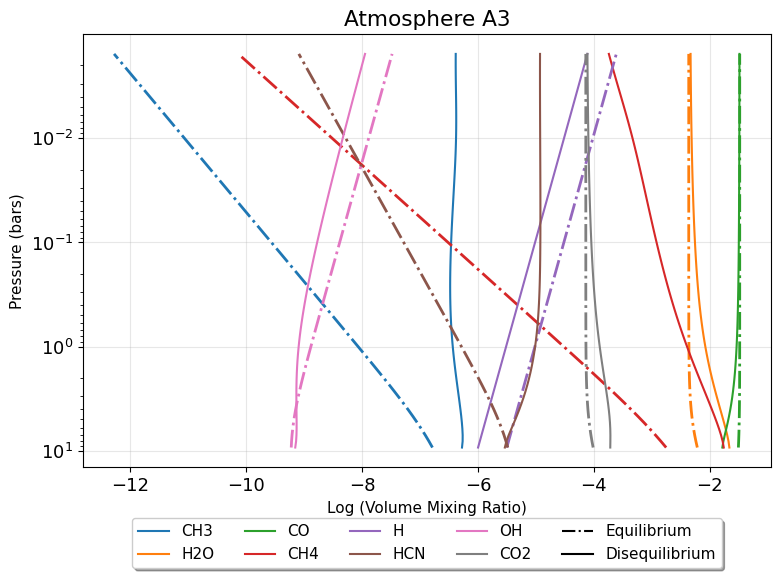

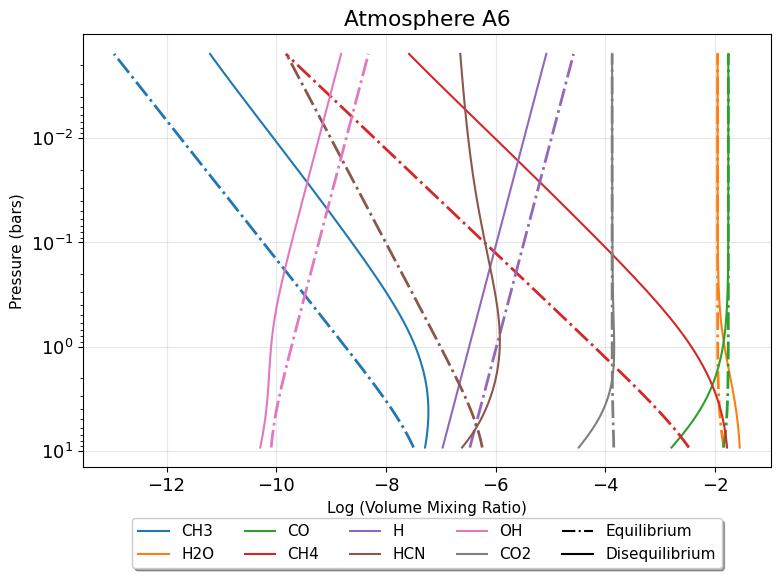

In [19]:
chosen_molecules = ['CH3', 'H2O', 'CO','CH4','H','HCN','OH','CO2']
logVMR_vs_pressure_equlibrium_disequilibrium( network_input, ground_truth, 429,
                                             chosen_molecules, pressure, save=False)
logVMR_vs_pressure_equlibrium_disequilibrium( network_input, ground_truth, 3037,
                                             chosen_molecules, pressure, save=False)

# Disequilibrium and Network Prediction

In [20]:
def logVMR_vs_pressure(network_output, network_input, ground_truth, n, chosen_molecules, pascals_values,
                  name=None, save=False):
    if n not in index_atmosphere_dict:
        index_atmosphere_dict[n]=n
    co,m,t= configuration.loc[n][['co_ratio','metalicity','isothermal_T']]
    bars_values = convert_pascals_to_bars(pascals_values)
    
    fig, axs = plt.subplots(2, 1, figsize=(8, 8), gridspec_kw={'height_ratios': [3, 1]})
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f']
    # Main plot
    ax = axs[0]
    for i, mol in enumerate(chosen_molecules):
        color = colors[i % len(colors)]
        ax.plot(inverse_preprocessing(network_output[n, molecules.index(mol), :]), bars_values, '--',
                lw=3, label=mol, color=color)
        ax.plot(inverse_preprocessing(ground_truth[n, molecules.index(mol), :]), bars_values, '-',
                lw=1, color=color)

    ax.set_yscale('log')
    ax.invert_yaxis()

    ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), fancybox=True, shadow=True, ncol=5)
   
    ax.grid(alpha=0.3)
    ax.set_title(f'Model {name}, Atmosphere {index_atmosphere_dict[n]}')
    
    ax.set_xlabel('Log (Volume Mixing Ratio)')
    ax.set_ylabel('Pressure (bars)')

    # Define custom lines for the legend here
    line_output = mlines.Line2D([], [], color='black', linestyle='--', linewidth=3, label='Network Output')
    line_truth = mlines.Line2D([], [], color='black', linestyle='-', linewidth=1, label='Ground Truth')

    # Residual plot
    ax_res = axs[1]
    for i, mol in enumerate(chosen_molecules):
        color = colors[i % len(colors)]
        residual = inverse_preprocessing(ground_truth[n, molecules.index(mol), :]) - inverse_preprocessing(network_output[n, molecules.index(mol), :])
        ax_res.plot(residual, bars_values, '.', label=mol, color=color)
    ax_res.legend(handles=[line_output, line_truth],loc='upper center', bbox_to_anchor=(0.5, 1.4),
                  fancybox=True, shadow=True, ncol=2)
    ax_res.set_xlabel('Residual (Ground Truth - Network Output)')
    ax_res.set_ylabel('Pressure (bars)')
    ax_res.grid(alpha=0.3)
    ax_res.invert_yaxis()
    ax_res.set_yscale('log')
    plt.tight_layout()
    if save:
        plt.savefig(f'Atmosphere_{n}_{name}_V2.png')
    plt.show()

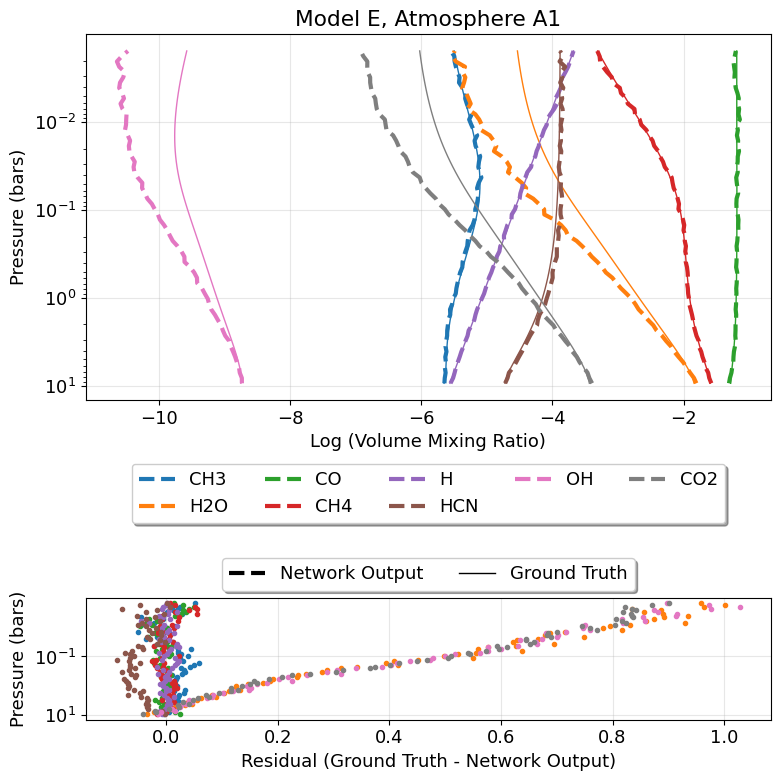

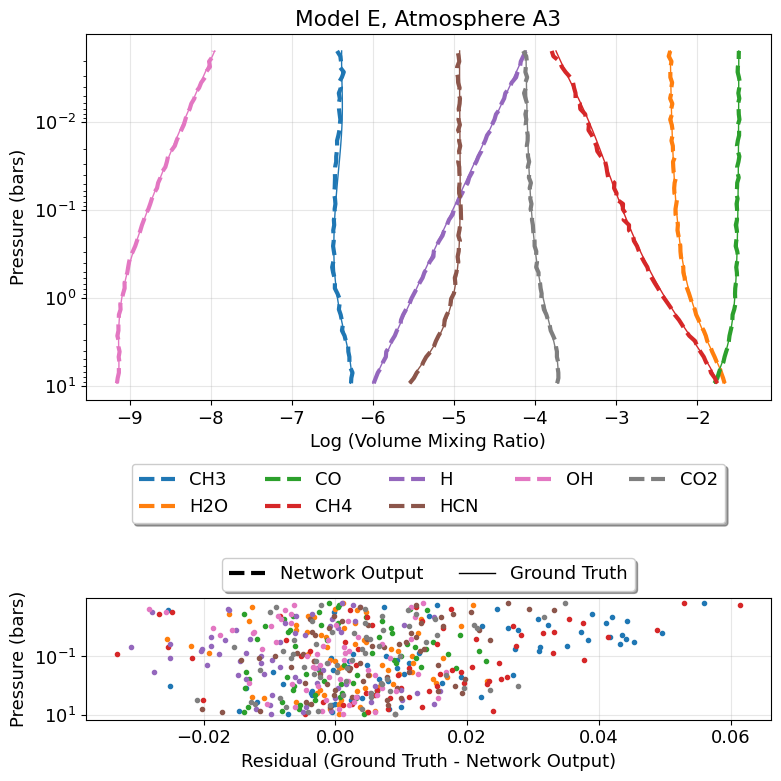

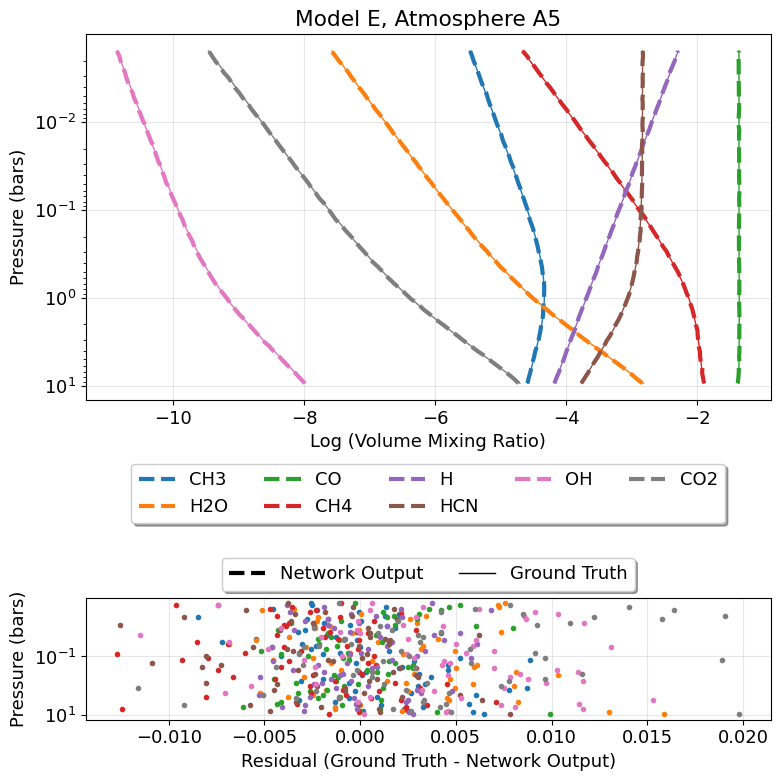

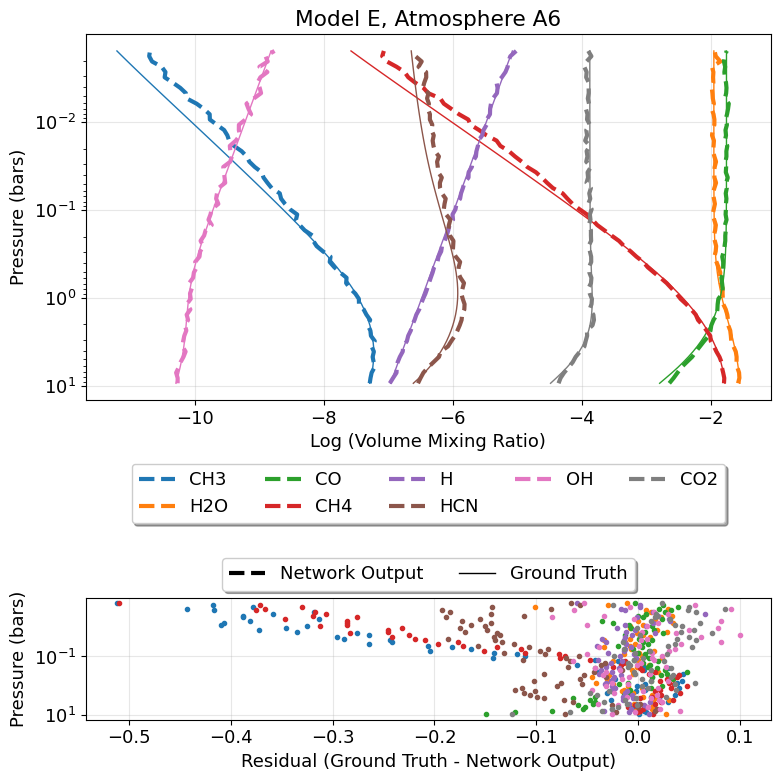

In [21]:
chosen_molecules = ['CH3', 'H2O', 'CO','CH4','H','HCN','OH','CO2']
labels = ['Model A','Model C', 'Model E']

logVMR_vs_pressure(network_output_dl8, network_input, ground_truth, 7, 
                   chosen_molecules, pressure, name='E', save=True)
logVMR_vs_pressure(network_output_dl8, network_input, ground_truth, 429, 
                   chosen_molecules, pressure, name='E', save=True)
logVMR_vs_pressure(network_output_dl8, network_input, ground_truth, 2075, 
                   chosen_molecules, pressure, name='E', save=True)
logVMR_vs_pressure(network_output_dl8, network_input, ground_truth, 3037, 
                   chosen_molecules, pressure, name='E', save=True)

In [ ]:
chosen_molecules = ['CH3', 'H2O', 'CO','CH4','H','HCN','OH','CO2']
labels = ['A: Simple Model','C: Unet with Attention and Add info', 'E: Unet with Att, Add Info, DL, bs8']

logVMR_vs_pressure(network_output_dl8, network_input, ground_truth, 32, 
                   chosen_molecules, pressure, name='E', save=True)
logVMR_vs_pressure(network_output_dl8, network_input, ground_truth, 1291, 
                   chosen_molecules, pressure, name='E', save=True)
logVMR_vs_pressure(network_output_simple, network_input, ground_truth, 32, 
                   chosen_molecules, pressure, name='A', save=True)
logVMR_vs_pressure(network_output_simple, network_input, ground_truth, 1291, 
                   chosen_molecules, pressure, name='A', save=True)

# Mean Absolute Error per Molecule per Layer for One Atmosphere

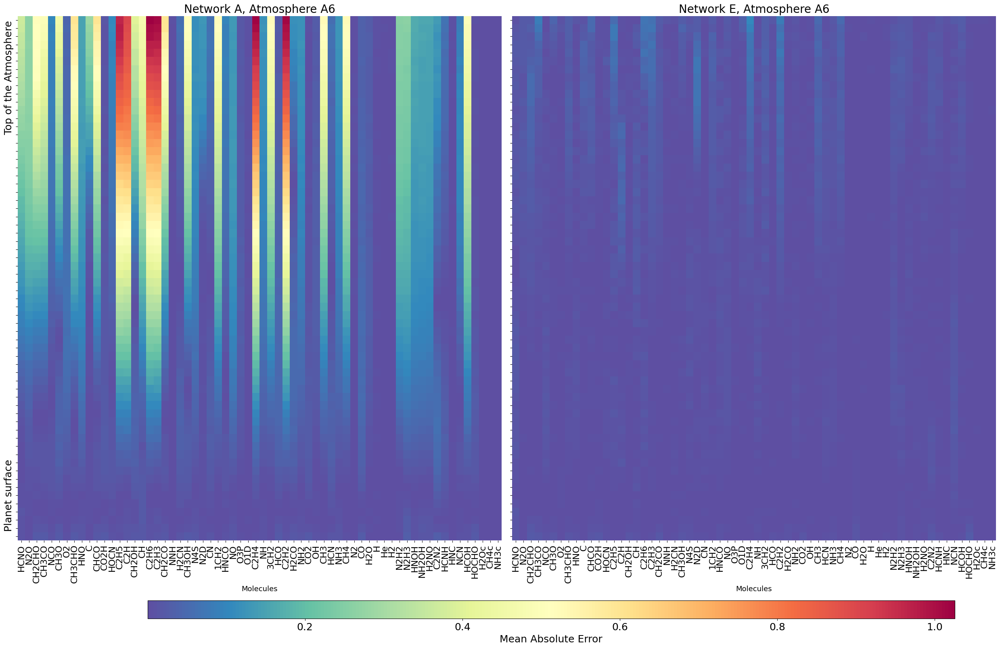

In [23]:
ylabels = [''] * 64  # Create a list of empty strings for each layer.
ylabels[-8] = 'Top of the Atmosphere'  # Set the first element to 'Top of the Atmosphere'.
ylabels[5] = 'Planet surface'

n = 3037
average_importance_simple =np.abs(network_output_simple[n] - ground_truth[n])
average_importance_bs8 = np.abs(network_output_dl8[n] - ground_truth[n])
min_val = min(np.min(average_importance_simple), np.min(average_importance_bs8)) # Adjust for your actual data
max_val = max(np.max(average_importance_simple), np.max(average_importance_bs8)) # Adjust for your actual data

fig, axes = plt.subplots(1, 2, figsize=(25, 15), sharey=True)  # Adjust size as needed

# First subplot
sns.heatmap(average_importance_simple.T, cmap='Spectral_r', ax=axes[0],
            xticklabels=molecules, yticklabels=True,
            vmin=min_val, vmax=max_val, cbar=False)
axes[0].set_title(f'Network A, Atmosphere {index_atmosphere_dict[n]}', fontsize=20)
axes[0].set_xlabel('Molecules')
axes[0].invert_yaxis()  # Invert the y-axis to have 'Planet surface' at the bottom.
axes[0].set_yticklabels(ylabels, fontsize=18)  
axes[0].set_xticklabels(molecules, fontsize=16)  
axes[0].tick_params(axis='x', rotation=90)
axes[0].tick_params(axis='y', rotation=90)
# Second subplot
sns.heatmap(average_importance_bs8.T, cmap='Spectral_r', ax=axes[1],
            xticklabels=molecules,yticklabels=True,
            vmin=min_val, vmax=max_val, cbar=False)
axes[1].set_title(f'Network E, Atmosphere {index_atmosphere_dict[n]}', fontsize=20)
axes[1].set_xlabel('Molecules')
axes[1].invert_yaxis()  
axes[1].set_yticklabels(ylabels)  
axes[1].set_xticklabels(molecules, fontsize=16)  
axes[1].tick_params(axis='x', rotation=90)
axes[1].tick_params(axis='y', rotation=90)

plt.tight_layout()
cbar_ax = fig.add_axes([0.15, -0.03, 0.8, 0.03])  # [left, bottom, width, height]
sm = plt.cm.ScalarMappable(cmap='Spectral_r', norm=plt.Normalize(vmin=min_val, vmax=max_val))
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Mean Absolute Error', fontsize=18)  # Increase fontsize as needed
# To increase the tick label size
cbar.ax.tick_params(labelsize=18)
# Uncomment the line below to save the figure
plt.savefig(f'MAE_MA_ME_layer_Atmosphere{index_atmosphere_dict[n]}_V2.png', dpi=300, bbox_inches='tight')
plt.show()

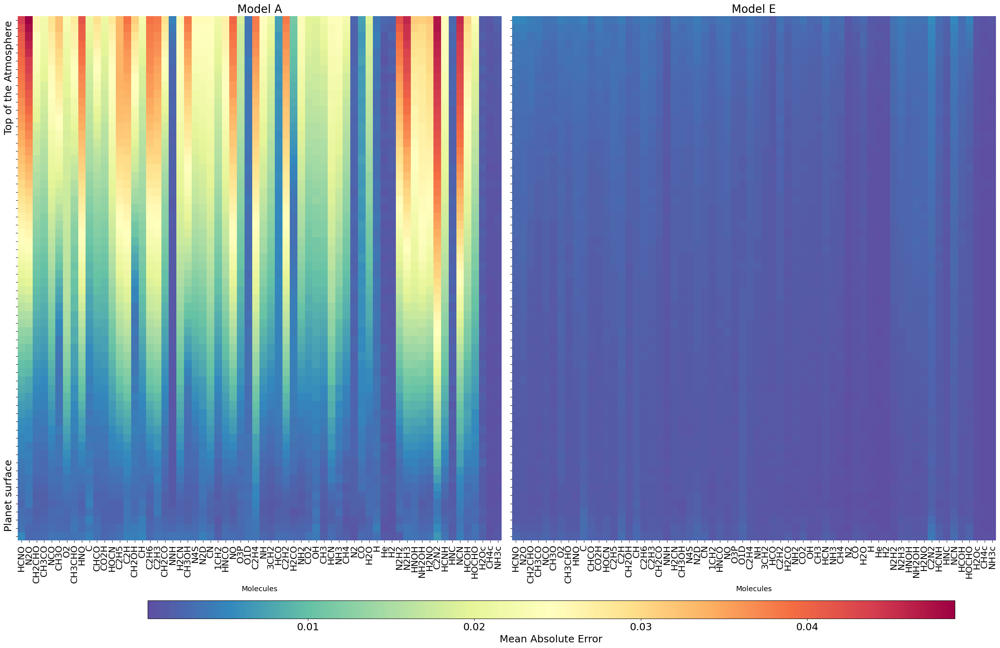

In [24]:
ylabels = [''] * 64  # Create a list of empty strings for each layer.
ylabels[-8] = 'Top of the Atmosphere'  # Set the first element to 'Top of the Atmosphere'.
ylabels[5] = 'Planet surface'
average_importance_simple =np.mean(np.abs(network_output_simple - ground_truth), axis=0)
average_importance_bs8 = np.mean(np.abs(network_output_dl8 - ground_truth), axis=0)
min_val = min(np.min(average_importance_simple), np.min(average_importance_bs8)) # Adjust for your actual data
max_val = max(np.max(average_importance_simple), np.max(average_importance_bs8)) # Adjust for your actual data

# Create figure with two subplots
fig, axes = plt.subplots(1, 2, figsize=(25, 15), sharey=True) # Adjust size as needed
# First subplot
sns.heatmap(average_importance_simple.T, cmap='Spectral_r', ax=axes[0],
            xticklabels=molecules, yticklabels=True,
            vmin=min_val, vmax=max_val, cbar=False)
axes[0].set_title(f'Model A', fontsize=20)
axes[0].set_xlabel('Molecules')
axes[0].invert_yaxis()  # Invert the y-axis to have 'Planet surface' at the bottom.
axes[0].set_yticklabels(ylabels, fontsize=18)  
axes[0].set_xticklabels(molecules, fontsize=16)  
axes[0].tick_params(axis='x', rotation=90)
axes[0].tick_params(axis='y', rotation=90)
# Second subplot
sns.heatmap(average_importance_bs8.T, cmap='Spectral_r', ax=axes[1],
            xticklabels=molecules, yticklabels=True,
            vmin=min_val, vmax=max_val, cbar=False)
axes[1].set_title(f'Model E', fontsize=20)
axes[1].set_xlabel('Molecules')
axes[1].invert_yaxis()  # Invert the y-axis to have 'Planet surface' at the bottom.
axes[1].set_yticklabels(ylabels)  # Manually set y-tick labels
axes[1].set_xticklabels(molecules, fontsize=16)  
axes[1].tick_params(axis='x', rotation=90)
axes[1].tick_params(axis='y', rotation=90)


plt.tight_layout()
cbar_ax = fig.add_axes([0.15, -0.03, 0.8, 0.03])  # [left, bottom, width, height]
sm = plt.cm.ScalarMappable(cmap='Spectral_r', norm=plt.Normalize(vmin=min_val, vmax=max_val))
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Mean Absolute Error', fontsize=18)  # Increase fontsize as needed
# To increase the tick label size
cbar.ax.tick_params(labelsize=18)
plt.savefig(f'MAE_MA_ME_layer_V2.png', dpi=300,bbox_inches='tight')
plt.show()

# MAE per Molecule

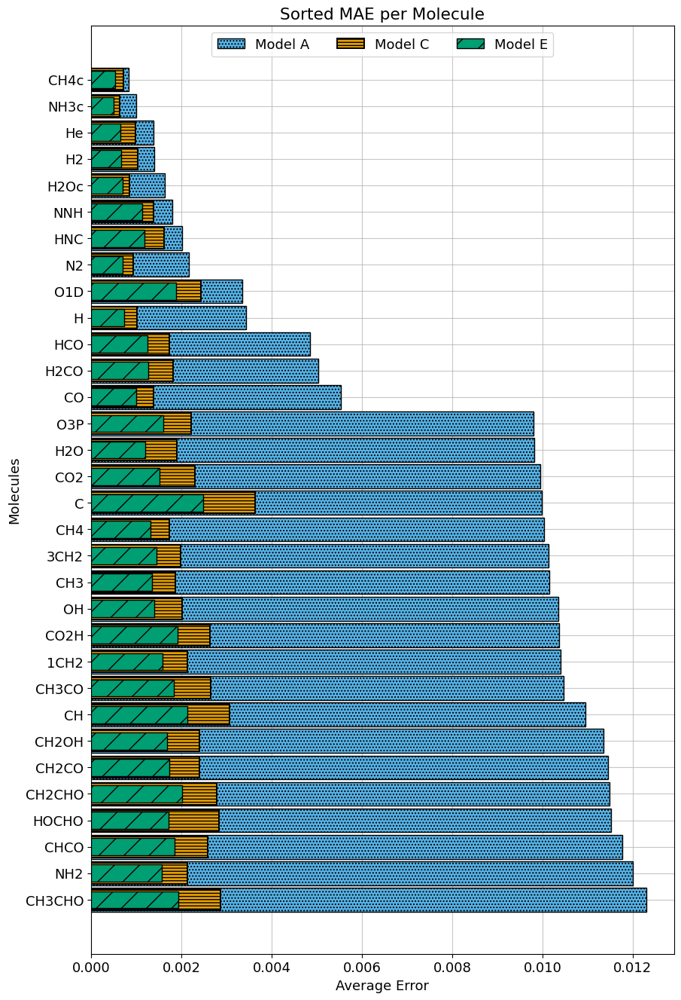

In [25]:
feature_importance_simple = np.mean(np.abs(network_output_simple - ground_truth), axis=0).mean(axis=1)
feature_importance_att_addinf = np.mean(np.abs(network_output_att_addinf - ground_truth), axis=0).mean(axis=1)
feature_importance_dl8 = np.mean(np.abs(network_output_dl8 - ground_truth), axis=0).mean(axis=1)
# Sort feature importance and corresponding molecules
sorted_indices = np.argsort(feature_importance_simple)[::-1]
sorted_importance_simple = feature_importance_simple[sorted_indices]
sorted_importance_att_addinf = feature_importance_att_addinf[sorted_indices]
sorted_importance_dl8 = feature_importance_dl8[sorted_indices]
sorted_molecules = [molecules[i] for i in sorted_indices]
colors = ['#444B70','#8BBBB4', '#EFCB8C']
# Plotting
plt.figure(figsize=(10, len(sorted_molecules)/4))

plt.barh(sorted_molecules[32:], sorted_importance_simple[32:], color ='#56B4E9',label = 'Model A' ,
         height=0.9, edgecolor = 'black', zorder=3, hatch='....')
plt.barh(sorted_molecules[32:], sorted_importance_att_addinf[32:], color = '#E69F00',label = 'Model C',
         height = 0.8, edgecolor = 'black', zorder=3, lw=1.4, hatch='----')
plt.barh(sorted_molecules[32:], sorted_importance_dl8[32:], color ='#009E73', label = 'Model E',
         height = 0.65, edgecolor = 'black', zorder=3, hatch='/', lw=1 )

plt.legend(loc='upper center', bbox_to_anchor=(0.5,1), ncols = 3)
plt.xlabel('Average Error')
plt.ylabel('Molecules')
plt.title('Sorted MAE per Molecule')
plt.grid(alpha=0.7, zorder=0)
plt.savefig('MAE_vs_Molecules_P1_V2.png', dpi=300,bbox_inches='tight')
plt.show()

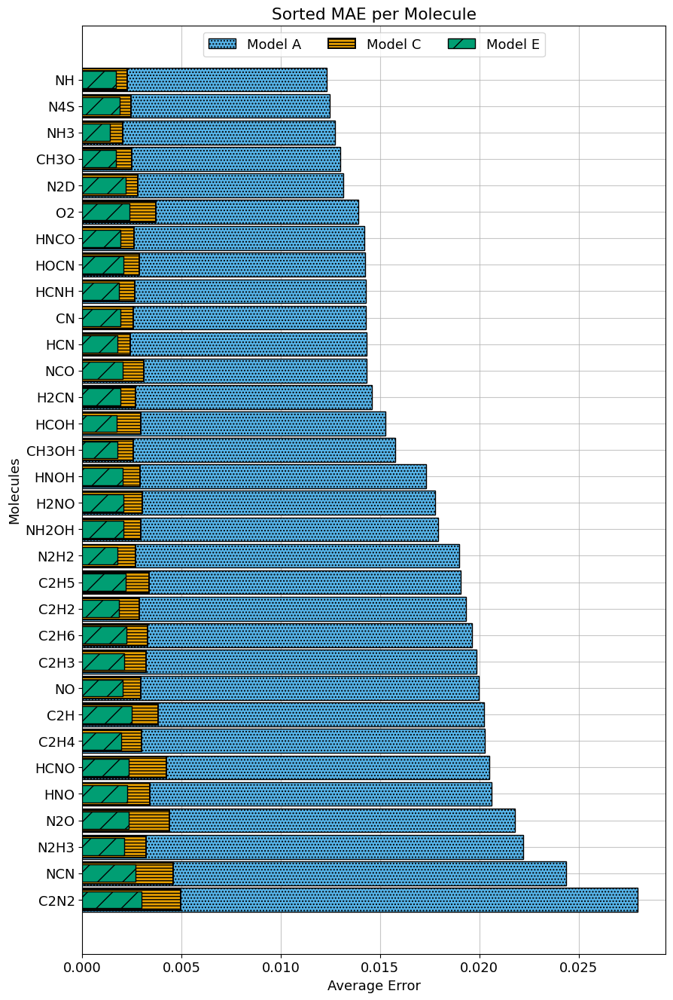

In [26]:
feature_importance_simple = np.mean(np.abs(network_output_simple - ground_truth), axis=0).mean(axis=1)
feature_importance_att_addinf = np.mean(np.abs(network_output_att_addinf - ground_truth), axis=0).mean(axis=1)
feature_importance_dl8 = np.mean(np.abs(network_output_dl8 - ground_truth), axis=0).mean(axis=1)
# Sort feature importance and corresponding molecules
sorted_indices = np.argsort(feature_importance_simple)[::-1]
sorted_importance_simple = feature_importance_simple[sorted_indices]
sorted_importance_att_addinf = feature_importance_att_addinf[sorted_indices]
sorted_importance_dl8 = feature_importance_dl8[sorted_indices]
sorted_molecules = [molecules[i] for i in sorted_indices]
colors = ['#444B70','#8BBBB4', '#EFCB8C']
# Plotting
plt.figure(figsize=(10, len(sorted_molecules)/4))

plt.barh(sorted_molecules[:32], sorted_importance_simple[:32], color ='#56B4E9',label = 'Model A' ,
         height=0.9, edgecolor = 'black', zorder=3, hatch='....')
plt.barh(sorted_molecules[:32], sorted_importance_att_addinf[:32], color = '#E69F00',label = 'Model C',
         height = 0.8, edgecolor = 'black', zorder=3, lw=1.4, hatch='----')
plt.barh(sorted_molecules[:32], sorted_importance_dl8[:32], color ='#009E73', label = 'Model E',
         height = 0.65, edgecolor = 'black', zorder=3, hatch='/', lw=1 )

plt.legend(loc='upper center', bbox_to_anchor=(0.5,1), ncols = 3)
plt.xlabel('Average Error')
plt.ylabel('Molecules')
plt.title('Sorted MAE per Molecule')
plt.grid(alpha=0.7, zorder=0)
plt.savefig('MAE_vs_Molecules_P2_V2.png', dpi=300,bbox_inches='tight')
plt.show()

In [ ]:
feature_importance_simple = np.mean(np.abs(network_output_simple - ground_truth), axis=0).mean(axis=1)
feature_importance_att_addinf = np.mean(np.abs(network_output_att_addinf - ground_truth), axis=0).mean(axis=1)
feature_importance_dl8 = np.mean(np.abs(network_output_dl8 - ground_truth), axis=0).mean(axis=1)
# Sort feature importance and corresponding molecules
sorted_indices = np.argsort(feature_importance_simple)
sorted_importance_simple = feature_importance_simple[sorted_indices]
sorted_importance_att_addinf = feature_importance_att_addinf[sorted_indices]
sorted_importance_dl8 = feature_importance_dl8[sorted_indices]
sorted_molecules = [molecules[i] for i in sorted_indices]
colors = ['#444B70','#8BBBB4', '#EFCB8C']
# Plotting
plt.figure(figsize=(10, len(sorted_molecules)/2))
plt.barh(sorted_molecules, sorted_importance_simple, color ='#56B4E9',label = 'Model A' ,
         height=0.9, edgecolor = 'black', zorder=3, hatch='....')
plt.barh(sorted_molecules, sorted_importance_att_addinf, color = '#E69F00',label = 'Model C',
         height = 0.8, edgecolor = 'black', zorder=3, lw=1.4, hatch='----')
plt.barh(sorted_molecules, sorted_importance_dl8, color ='#009E73', label = 'Model E',
         height = 0.65, edgecolor = 'black', zorder=3, hatch='/', lw=1 )
plt.legend(loc='upper center', bbox_to_anchor=(0.5,1), ncols = 3)
plt.xlabel('Average Error')
plt.ylabel('Molecules')
plt.title('Sorted MAE per Molecule')
plt.grid(alpha=0.7, zorder=0)
plt.show()

# Visualise MAE vs Planet Parameters

In [28]:
def temperature_vs_pressure(network_output, ground_truth, pascals_values, name=None, save=False):
    t = configuration['isothermal_T'].to_numpy()
    temperature_expanded = t[:, np.newaxis]
    temperature_final = np.tile(temperature_expanded, (1, 64))
    bars_values = convert_pascals_to_bars(pascals_values)
    
    fig, ax = plt.subplots(figsize=(15, 6))
    sample_mae = np.mean(np.abs(network_output - ground_truth), axis=1)

    
    high_error_indices = np.mean(sample_mae, axis=1) > 0.0124 

    
    temperature_final_filtered = temperature_final#[high_error_indices]
    expanded_bars_values = np.tile(bars_values, (len(temperature_final_filtered), 1))
    sample_mae_filtered = sample_mae#[high_error_indices]

    # Plot for planet mass
    scatter = ax.scatter(x=temperature_final_filtered, y=expanded_bars_values,
                         c=sample_mae_filtered, alpha=0.9, zorder=2, s=30,
                         edgecolor='black', linewidth=0.2, cmap='Spectral_r')
    #ax.axhline(y=1, color='black', linestyle='--', linewidth=1.5)
    #ax.axhline(y=2.0417379446695274, color='black', linestyle='--', linewidth=1.5)
    # Creating color bar for planet mass
    ax.set_yscale('log')
    ax.invert_yaxis()
    ax.set_xlim(1099, 2001)
    cbar = plt.colorbar(scatter)
    cbar.set_label('Mean Absolute Error', labelpad=-60)

    ax.set_xlabel('Isothermal Temperature [K]')
    ax.set_ylabel('Pressure [bars]')
    ax.set_title(f'Model {name}: Pressure vs. Isothermal Temperature', fontsize=13)
    plt.grid(alpha=0.5, zorder=0)
    
    
    
    if save:
        plt.savefig(f'Pressure_temperature_{name}_V2.png')
    
    plt.show()

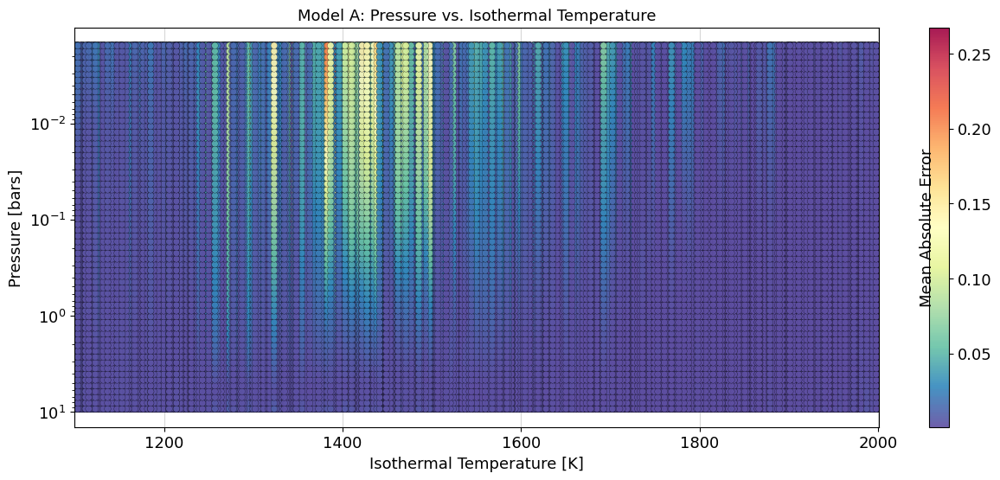

In [29]:
temperature_vs_pressure(network_output_simple, ground_truth, pressure,
                  name='A', save=True)

In [30]:
def plot_error_vs_parameters(df, network_output, ground_truth, labels,save=False):
    for i in range(len(labels)):
        sample_mae = calculate_samplewise_mae(network_output[i], ground_truth)
        df[f'Error{i+1}'] = sample_mae
    fig, axs = plt.subplots(1, len(labels), figsize=(15, 8))  # Create a figure and a set of subplots
    labelsize = 14  # Font size for x and y labels
    titlesize = 14  # Font size for titles
    ticksize = 14   # Font size for tick labels
    fig.suptitle('Mean Absolute Error vs. Temperature', fontsize=16, y=0.95)  # Set the main title
    colors = ['#444B70','#8BBBB4', '#EFCB8C']
    for i, ax in enumerate(axs):
        sns.scatterplot(ax=ax, x=df['isothermal_T'], y=df[f'Error{i+1}'], color=colors[i],
                        alpha=1, zorder=3, s=40, edgecolor='black', linewidth=0.2 )
        if i == 0:
            sns.scatterplot(ax=ax, x=[1400], y=[0.02], color=colors[i],
                        alpha=1, zorder=3, s=40, edgecolor='black', linewidth=0.2, label = 'Model A' )
            sns.scatterplot(ax=ax, x=df['isothermal_T'], y=df[f'Error{3}'],marker = '*', color=colors[2],
                            zorder=3, s=200, edgecolor='black', linewidth=0.6, label = 'Model E' )
            plt.legend()
        ax.set_xlabel('Isothermal Temperature [K]', fontsize=labelsize)
        ax.set_ylabel('MAE', fontsize=labelsize)
        ax.tick_params(labelsize=ticksize)
        ax.grid(alpha=0.5, zorder=0)
        ax.set_facecolor('white')
        ax.set_title(f'Model {labels[i]}', fontsize=titlesize)  # Set the subplot title
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust the layout
    if save:
        plt.savefig(f'MAE_vs_Temperature_V2.png', dpi=300,bbox_inches='tight')
    plt.show()

def plot_mae_vs_temperature(network_output, ground_truth, configuration,name, save=False):
    fig, ax = plt.subplots(figsize=(8, 6))
    sample_mae = calculate_samplewise_mae(network_output, ground_truth)
    configuration['Error'] = sample_mae
    # Plot for planet mass
    scatter = ax.scatter(x=configuration['isothermal_T'], y=configuration['Error'],
                         c=configuration['planet_mass'], alpha=1, zorder=3, s=30, 
                         edgecolor='black', linewidth=0.2, cmap='Spectral_r')
    # Creating color bar for planet mass
    cbar = plt.colorbar(scatter)
    cbar.set_label('Planet Mass $M_J$')

    ax.set_xlabel('Isothermal Temperature [K]')
    ax.set_ylabel('MAE')
    ax.set_title(f'Model {name}: MAE vs. Isothermal Temperature - Planet Mass', fontsize = 13)
    plt.grid(alpha=0.5, zorder=0)
    if save:
        plt.savefig(f'MAE_vs_Temperature_Mass_color_Model{name}.png', dpi=300, bbox_inches='tight')
    plt.show()
    # Plot for C/O Ratio
    fig, ax = plt.subplots(figsize=(8, 6))
    scatter = ax.scatter(x=configuration['isothermal_T'], y=configuration['Error'],
                         c=configuration['co_ratio'], alpha=1, zorder=3, s=30, 
                         edgecolor='black', linewidth=0.2, cmap='Spectral_r')
    # Creating color bar for C/O Ratio
    cbar = plt.colorbar(scatter)
    cbar.set_label('C/O Ratio')

    plt.grid(alpha=0.5, zorder=0)
    ax.set_xlabel('Isothermal Temperature [K]')
    ax.set_ylabel('MAE')
    ax.set_title(f'Model {name}: MAE vs. Isothermal Temperature - C/O Ratio', fontsize = 13)
    
    if save:
        plt.savefig(f'MAE_vs_Temperature_COratio_color_Model{name}.png', dpi=300, bbox_inches='tight')
    plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


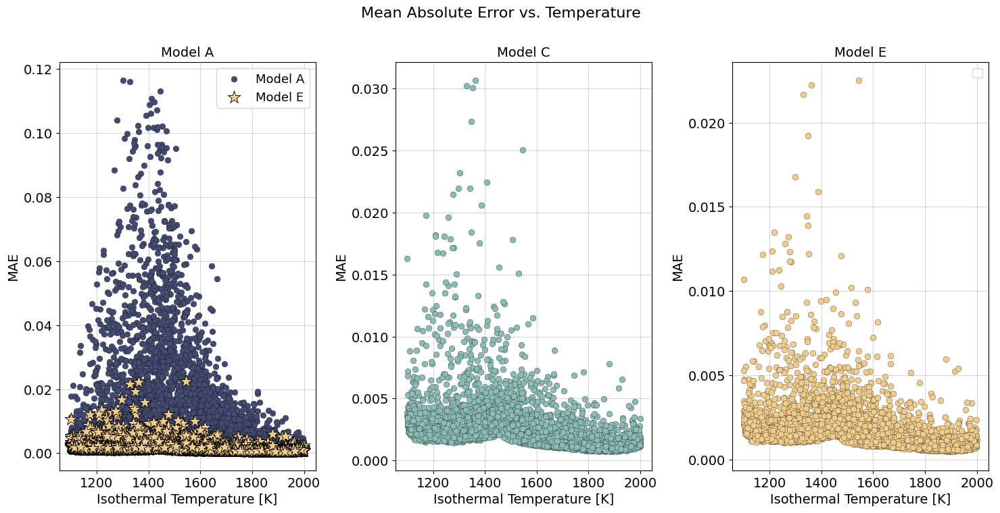

In [31]:
plot_error_vs_parameters(configuration,[network_output_simple,network_output_att_addinf, network_output_dl8],
                         ground_truth,['A','C','E'], save = True)

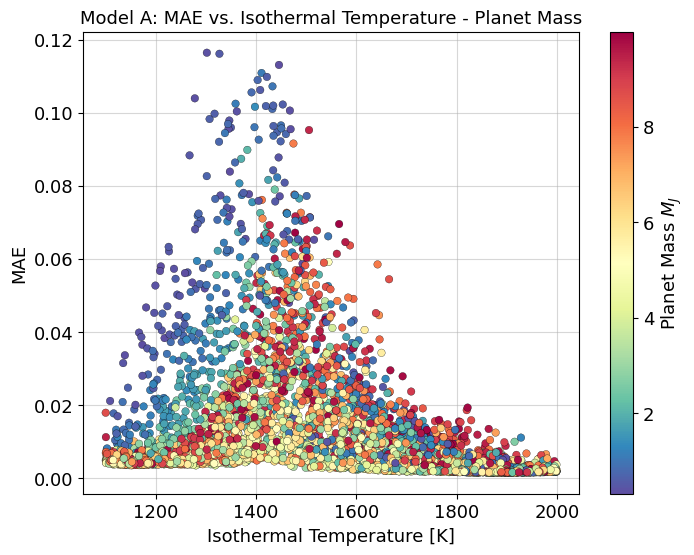

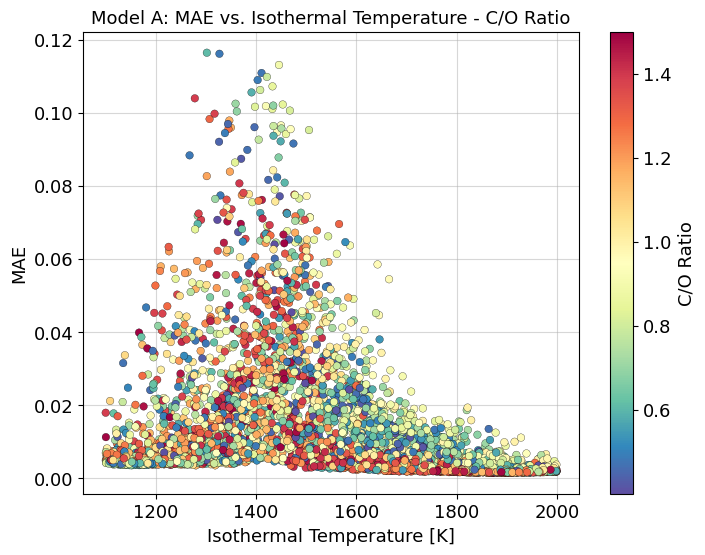

In [32]:
plot_mae_vs_temperature(network_output_simple, ground_truth, configuration, 'A', save=True)

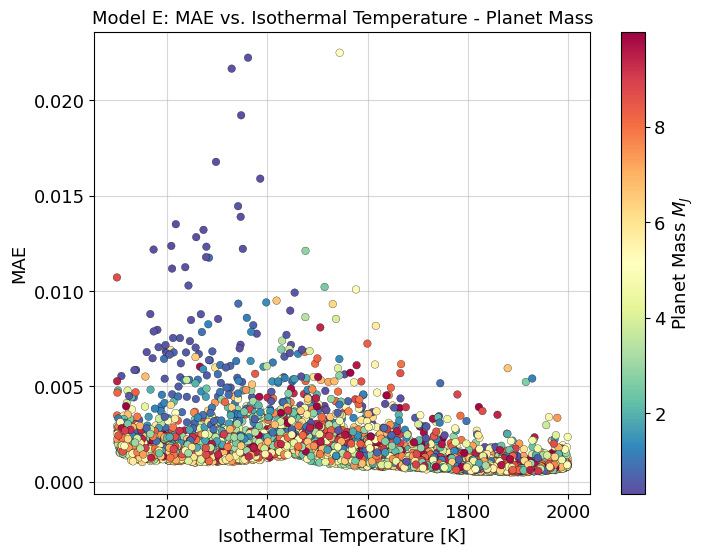

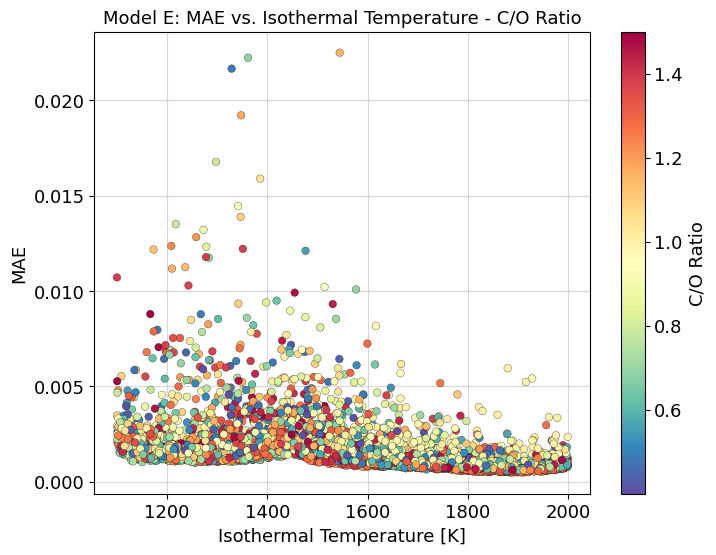

In [33]:
plot_mae_vs_temperature(network_output_dl8, ground_truth, configuration,'E', save=True)

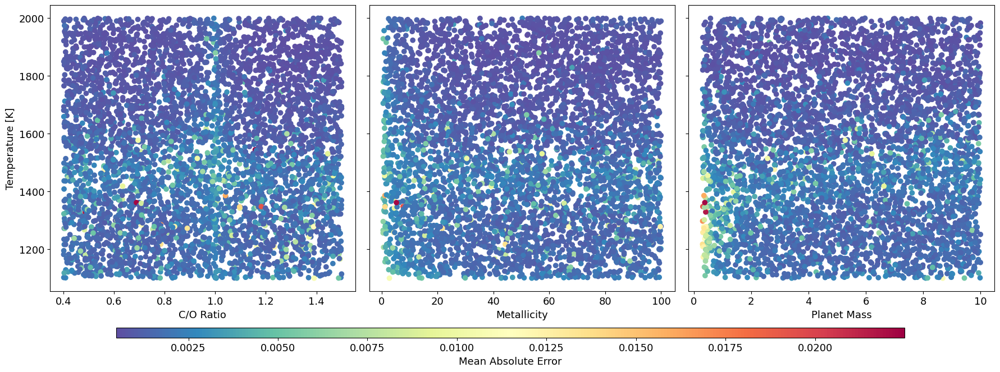

In [34]:
color = np.mean(np.abs(network_output_dl8 - ground_truth), axis=(1,2))
fig, axs = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
# Create a normalization object for color
norm = plt.Normalize(color.min(), color.max())
# C/O ratio vs. Temperature
sc = axs[0].scatter('co_ratio','isothermal_T', data=configuration, c=color, norm=norm, cmap='Spectral_r')
axs[0].set_xlabel('C/O Ratio')
axs[0].set_ylabel('Temperature [K]')
# Planet Radius vs. Temperature
axs[1].scatter('metalicity','isothermal_T', data=configuration, c=color, norm=norm, cmap='Spectral_r')
axs[1].set_xlabel('Metallicity')
# Metallicity vs. C/O Ratio
axs[2].scatter('planet_mass','isothermal_T', data=configuration, c=color, norm=norm, cmap='Spectral_r')
axs[2].set_xlabel('Planet Mass')

plt.tight_layout()  # Adjust layout
cbar_ax = fig.add_axes([0.12, -0.02, 0.78, 0.03])  # Adjust [left, bottom, width, height] as needed
cbar = fig.colorbar(sc, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Mean Absolute Error')
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


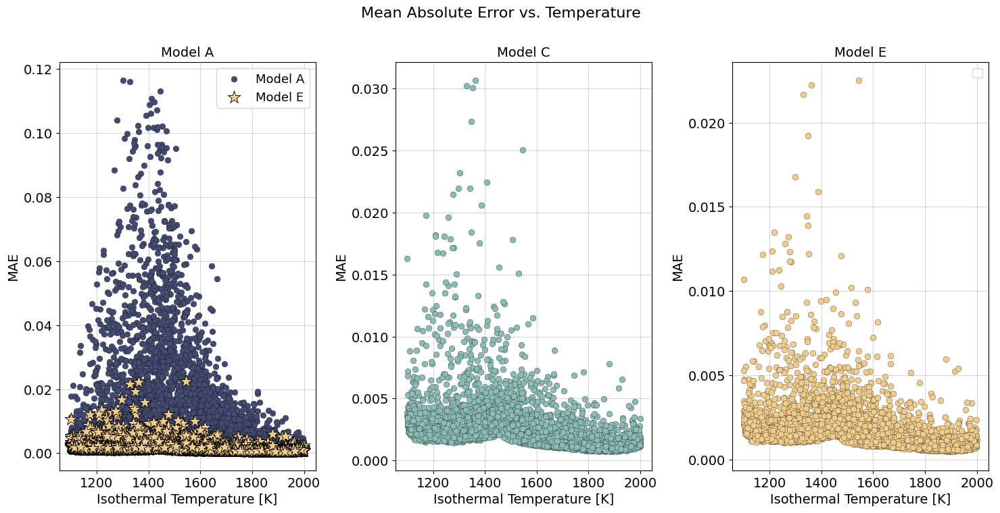

In [35]:
plot_error_vs_parameters(configuration,[network_output_simple,network_output_att_addinf, network_output_dl8],
                         ground_truth,['A','C','E'], save = True)

In [36]:
def pair_plot(network_output, ground_truth, configuration, name, save=False):
    color = np.mean(np.abs(network_output - ground_truth), axis=(1, 2))
    norm = plt.Normalize(color.min(), color.max())
    cmap = plt.cm.Spectral_r
    # Define parameters for the plots (original parameter names)
    parameters = ['planet_mass', 'co_ratio', 'isothermal_T', 'metalicity']
    # Mapping to more descriptive axis labels
    label_map = {
        'planet_mass': 'Planet Mass $M_J$',
        'co_ratio': 'C/O Ratio',
        'isothermal_T': 'Temperature (K)',
        'metalicity': 'Metalicity'
    }
    n = len(parameters)
    
    # Create subplots
    fig, axs = plt.subplots(n, n, figsize=(5*n, 4*n), constrained_layout=True)
    for i, param_i in enumerate(parameters):
        for j, param_j in enumerate(parameters):
            if i > j:  # Fill only the lower triangle excluding the diagonal
                sc = axs[i, j].scatter(configuration[param_j], configuration[param_i], c=color,
                                       norm=norm, cmap=cmap)

                # Set labels only on the outer axes, using the descriptive names
                if i == n - 1:  # Bottom row
                    axs[i, j].set_xlabel(label_map[param_j], fontsize=15)
                if j == 0:  # Left-most column
                    axs[i, j].set_ylabel(label_map[param_i], fontsize=15)        
            else:
                fig.delaxes(axs[i][j])  # Remove unused subplots
    plt.tight_layout(pad=3.0)
    plt.suptitle(f'Model {name}: Distribution of Initial Exoplanet Parameters colored by MAE',
                 x=0.3, y=0.75, fontsize=15)
    fig.subplots_adjust(right=0.8)  # Make room for the colorbar
    cbar_ax = fig.add_axes([0.1,-0.02, 0.4, 0.02])  # Adjusted position
    cbar = fig.colorbar(sc, cax=cbar_ax, orientation='horizontal')  # Correct orientation
    cbar_ax.yaxis.set_label_position("left")
    cbar_ax.set_title('Mean Absolute Error', pad=10, fontsize=11)
    if save:
        plt.savefig(f'initial_parameters_{name}_V2.png', dpi=300, bbox_inches='tight')
    plt.show()

The figure layout has changed to tight


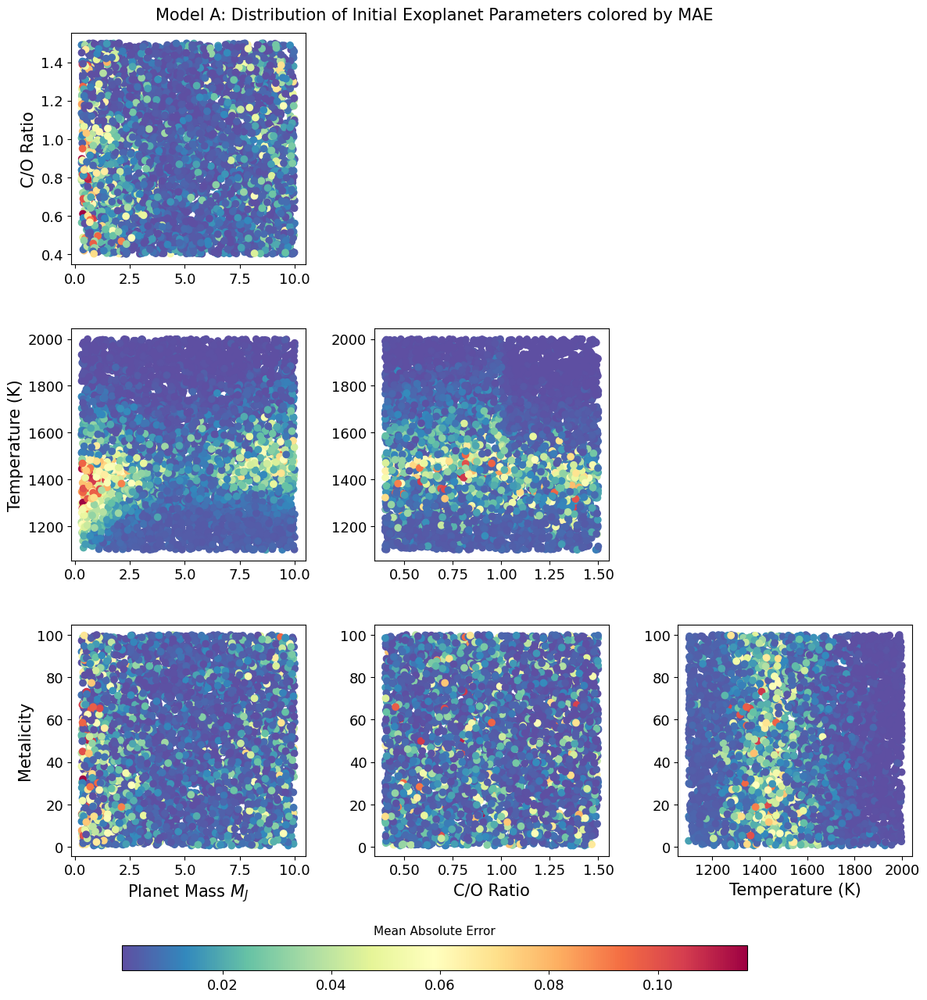

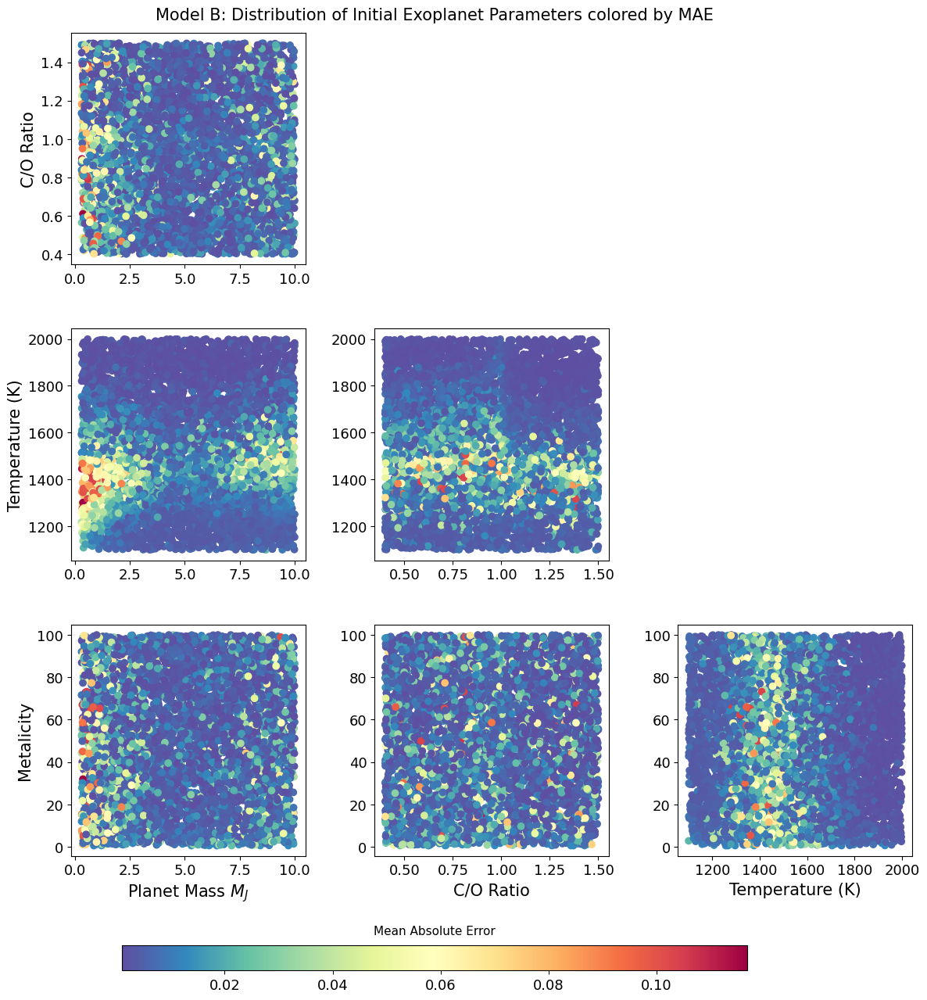

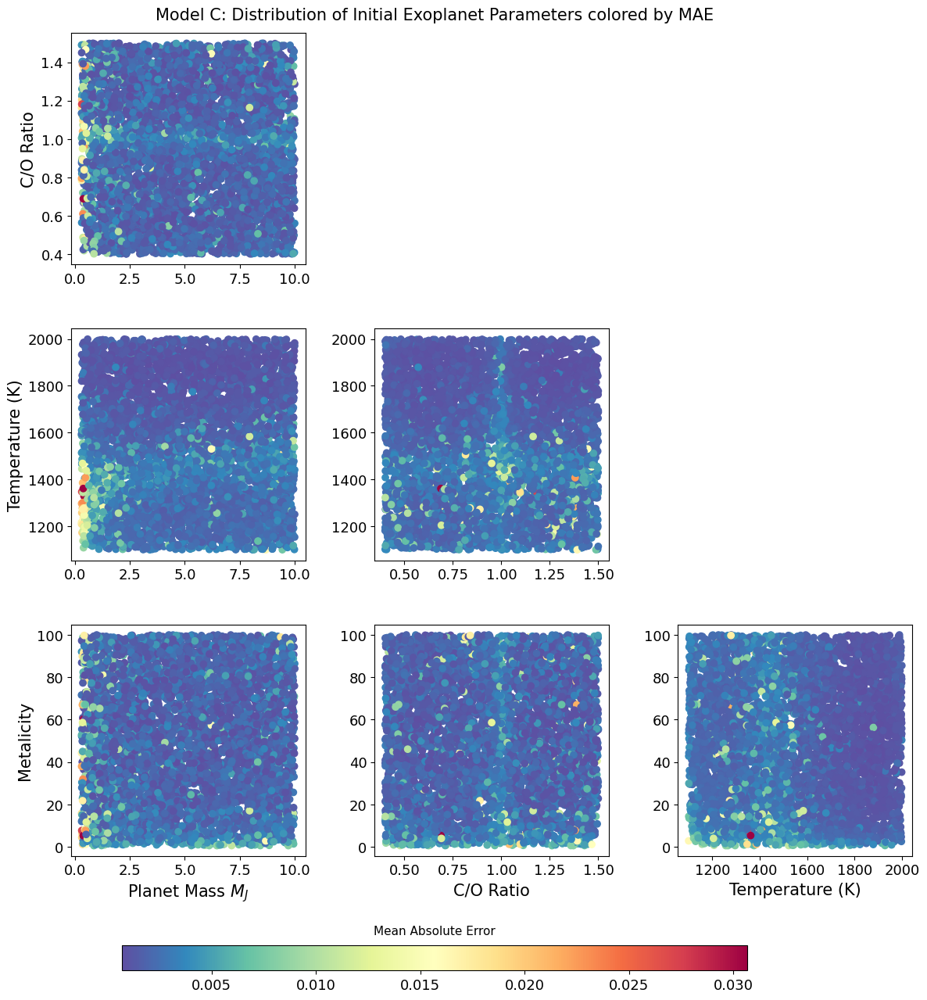

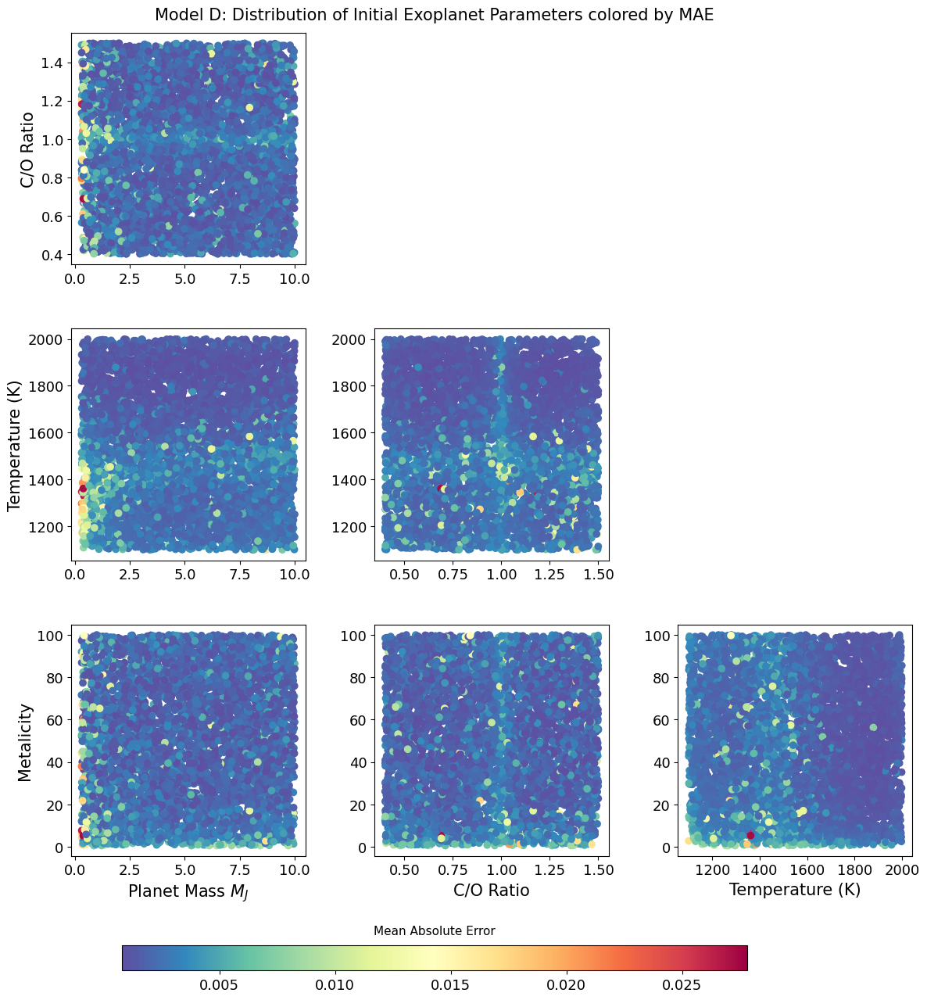

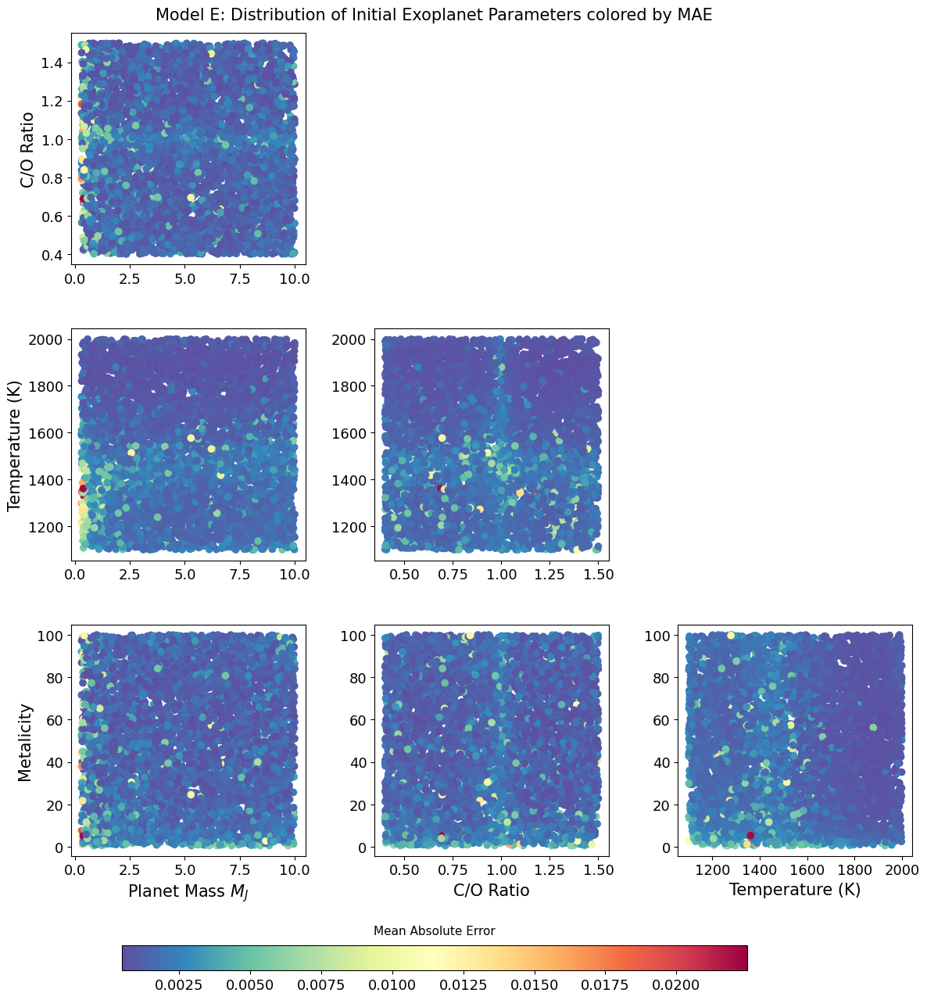

In [37]:
pair_plot(network_output_simple,ground_truth, configuration, 'A', save = False)
print('=='*50)
pair_plot(network_output_att,ground_truth, configuration,'B')
print('=='*50)
pair_plot(network_output_att_addinf,ground_truth, configuration,'C')
print('=='*50)
pair_plot(network_output_dl16,ground_truth, configuration, 'D')
print('=='*50)
pair_plot(network_output_dl8,ground_truth, configuration, 'E', save = False)